<a href="https://colab.research.google.com/github/malacosteus/DLS/blob/main/segmentation/segmentation_dermoscopic_SegNet_UNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p style="align: center;"><img align=center src="https://s8.hostingkartinok.com/uploads/images/2018/08/308b49fcfbc619d629fe4604bceb67ac.jpg" width=500 height=450/></p>

<h3 style="text-align: center;"><b>Курс "Глубокое обучение". Первый семестр</b></h3>

# Домашнее задание. Сегментация изображений

---


1.Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>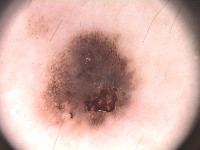</td><td>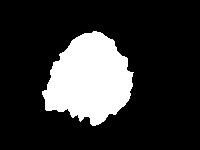</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем сегментировать их.

In [ ]:
! wget https://www.dropbox.com/s/k88qukc20ljnbuo/PH2Dataset.rar

--2020-12-24 18:55:06--  https://www.dropbox.com/s/k88qukc20ljnbuo/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6022:18::a27d:4212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/k88qukc20ljnbuo/PH2Dataset.rar [following]
--2020-12-24 18:55:07--  https://www.dropbox.com/s/raw/k88qukc20ljnbuo/PH2Dataset.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucbe23aa86e13c19a8577433052f.dl.dropboxusercontent.com/cd/0/inline/BFvs3xLOj86TCMXylNNd6Fil1HSlf7XV7_7dwPL5_hGekiWFnLV5GgNjjaXxCLVMXu4bLg9ErbNqJRoa6c7lIprB1p4kMgVKGwhrZYcjMY6reQ/file# [following]
--2020-12-24 18:55:07--  https://ucbe23aa86e13c19a8577433052f.dl.dropboxusercontent.com/cd/0/inline/BFvs3xLOj86TCMXylNNd6Fil1HSlf7XV7_7dwPL5_hGekiWFnLV5GgNjjaXxCLVMXu4bLg9ErbNqJRoa6c7lIprB1p4kMgVKGwhrZYcjMY6reQ/file
Resolvi

In [ ]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

Для загрузки датасета я предлагаю использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [ ]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize) можно использовать для изменения размера изображений. 
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [ ]:
from skimage.transform import resize

size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [ ]:
import numpy as np
import pandas as pd

X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [ ]:
len(lesions)

200

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

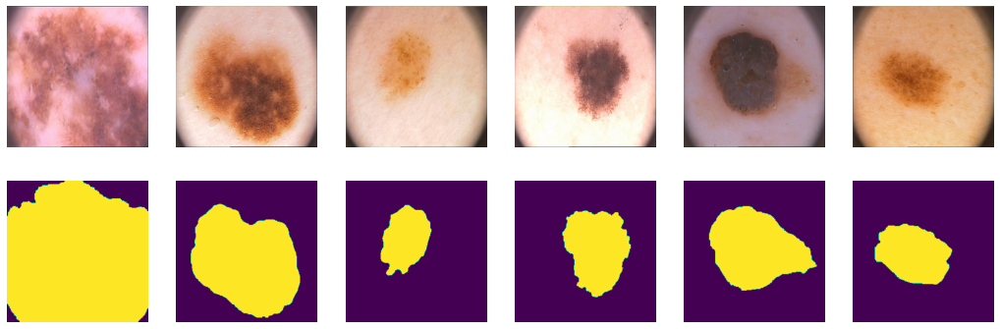

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для валидации и теста

In [ ]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [ ]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [ ]:
from torch.utils.data import DataLoader

batch_size = 15 
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])), 
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [ ]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

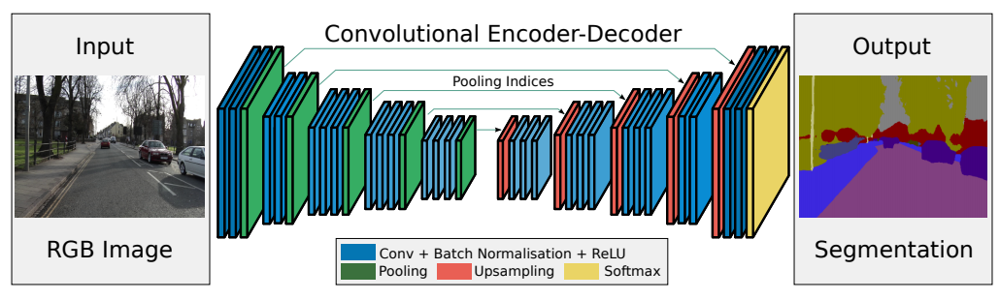

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [ ]:
def init_weights(m):
    if type(m) == nn.Linear:
        torch.nn.init.xavier_uniform(m.weight)
        m.bias.data.fill_(0.01)


def double_conv(in_channels, out_channels):
  conv = nn.Sequential(
      nn.Conv2d(in_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True),
      nn.Conv2d(out_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True)
  )
  return conv.apply(init_weights)


def triple_conv(in_channels, out_channels):
  conv = nn.Sequential(
      nn.Conv2d(in_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True),
      nn.Conv2d(out_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True),
      nn.Conv2d(out_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True)
  )
  return conv.apply(init_weights)


def bottleneck_conv(in_channels, out_channels):
  conv = nn.Sequential(
      nn.Conv2d(in_channels, out_channels, 1), #, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True),
      nn.Conv2d(out_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True),
      nn.Conv2d(out_channels, in_channels, 1), #, padding=1),
      nn.BatchNorm2d(in_channels),
      nn.ReLU(inplace=True)
  )
  return conv.apply(init_weights)


def out_conv(in_channels, out_channels):
  conv = nn.Sequential(
      nn.Conv2d(in_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(inplace=True),
      nn.Conv2d(out_channels, out_channels, 3, padding=1)
  )
  return conv.apply(init_weights)

In [ ]:
 class SegNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super().__init__()
       
        # encoder (downsampling)
        self.maxpool = nn.MaxPool2d(2, stride=2, return_indices=True)
        
        self.down1 = double_conv(n_channels, 64)
        self.down2 = double_conv(64, 128)
        self.down3 = triple_conv(128, 256)
        self.down4 = triple_conv(256, 512)
        self.down5 = triple_conv(512, 1024)
        self.down6 = bottleneck_conv(1024, 512)

        self.unpool = nn.MaxUnpool2d(2, stride=2)
        #self.bottleneck_unpool = nn.MaxUnpool2d(1, padding=1)

        self.up6 = bottleneck_conv(1024, 512)
        self.up5 = triple_conv(1024, 512)
        self.up4 = triple_conv(512, 256)
        self.up3 = triple_conv(256, 128)
        self.up2 = double_conv(128, 64)
        self.up1 = out_conv(64, n_classes)
        

    def forward(self, x):

        x = self.down1(x)
        #print('1', x.shape)
        x, id1 = self.maxpool(x)
        #print('11', x.shape, id1.shape)

        x = self.down2(x)
        x, id2 = self.maxpool(x)

        x = self.down3(x)
        x, id3 = self.maxpool(x)

        x = self.down4(x)
        x, id4 = self.maxpool(x)

        x = self.down5(x)
        x, id5 = self.maxpool(x)

        x = self.down6(x)
        x, id_bottleneck = self.maxpool(x)
        

        x = self.unpool(x,id_bottleneck)
        #print('61', x.shape)
        x = self.up6(x)
        #print('62', x.shape)

        x = self.unpool(x, id5)
        x = self.up5(x)

        x = self.unpool(x, id4)
        x = self.up4(x)

        x = self.unpool(x, id3)
        x = self.up3(x)

        x = self.unpool(x, id2)
        x = self.up2(x)

        x = self.unpool(x, id1)
        x = self.up1(x)

        return x

SegNet - bottleneck - следующие друг за другом сверточные слои со свертками с размерами ядер "1 - 3 - 1"

In [ ]:
 class SegNet2(nn.Module):
    def __init__(self, n_channels, n_classes):
        super().__init__()

        # encoder (downsampling)
        self.maxpool = nn.MaxPool2d(2, stride=2, return_indices=True)
        
        self.down1 = double_conv(n_channels, 64)
        self.down2 = double_conv(64, 128)
        self.down3 = triple_conv(128, 256)
        self.down4 = triple_conv(256, 512)
        self.down5 = triple_conv(512, 1024)

        
        self.unpool = nn.MaxUnpool2d(2, stride=2)
        #self.bottleneck_unpool = nn.MaxUnpool2d(1, padding=1)


        self.up5 = triple_conv(1024, 512)
        self.up4 = triple_conv(512, 256)
        self.up3 = triple_conv(256, 128)
        self.up2 = double_conv(128, 64)
        self.up1 = out_conv(64, n_classes)
        

    def forward(self, x):

        x = self.down1(x
        x, id1 = self.maxpool(x)

        x = self.down2(x)
        x, id2 = self.maxpool(x)

        x = self.down3(x)
        x, id3 = self.maxpool(x)

        x = self.down4(x)
        x, id4 = self.maxpool(x)

        x = self.down5(x)
        x, id5 = self.maxpool(x)

       
        x = self.unpool(x, id5)
        x = self.up5(x)

        x = self.unpool(x, id4)
        x = self.up4(x)

        x = self.unpool(x, id3)
        x = self.up3(x)

        x = self.unpool(x, id2)
        x = self.up2(x)

        x = self.unpool(x, id1)
        x = self.up1(x)

        return x

SegNet2 - простая реализация в соответствии со схемой

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


To clarify this we can see on the segmentation:
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


And the intersection will be the following:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [ ]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor): 
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds  ??? повышенная точность для серьезной медицинской задачи ???
    
    return thresholded

## Функция потерь [1 балл]

Теперь не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации. 

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits) в Тарая функция эквивалентна и не так подвержена численной неустойчивости.

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [ ]:
 def bce_loss(y_real, y_pred):
   y_real = y_real.to(device)
   y_pred = y_pred.to(device)
   loss = torch.maximum(y_pred, torch.zeros(y_pred.size()).to(device)) - y_pred * y_real + torch.log(1 + torch.exp(-torch.abs(y_pred)))
   
   return loss.mean()

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [ ]:
def train(model, opt, loss_fn, epochs, data_tr, data_val):

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, 'max', factor=0.9, patience=10)
    #scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size= 2, gamma=0.1)#, last_epoch=-1, verbose=False) #ss 5 to 2
    #scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer=opt, gamma=0.5)
    history = []
    X_val, Y_val = next(iter(data_val))
    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        avg_loss_val = 0

        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch = X_batch.to(device)   
            Y_batch = Y_batch.to(device)   
            opt.zero_grad()                
            # set parameter gradients to zero

            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred) 
            loss.backward()  # backward-pass
            opt.step()      
            opt.zero_grad()

            # calculate loss to show the user
            avg_loss += loss / len(data_tr)
            score = score_model(model, iou_pytorch, data_tr)
            #opt.step()

        
        toc = time()
        print('loss: %f' % avg_loss)

        model.eval()  # testing mode
        for X_val, Y_val in data_val:
          with torch.no_grad():
             Y_hat = model(X_val.to(device)).detach().to('cpu') #> 0.5 # detach and put into cpu

             loss_val = loss_fn(Y_val, Y_hat)
             avg_loss_val += loss_val / len(data_val)
             score_val = score_model(model, iou_pytorch, data_val)
    

        history.append((avg_loss, avg_loss_val, score, score_val))
        scheduler.step(score_val)

        
        # Visualize tools
        clear_output(wait=True)
        plt.figure(figsize=(18, 9))
        for k in range(5):
            plt.subplot(3, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray') #X_val to X_batch
            plt.title('Real')
            plt.axis('off')

            plt.subplot(3, 6, k+7)
            plt.imshow(Y_hat[k, 0]>0.5, cmap='gray')
            plt.title('Output')
            plt.axis('off')

            plt.subplot(3, 6, k+13)
            plt.imshow(Y_val[k, 0], cmap='gray')
            plt.title('Target')
            plt.axis('off')

        plt.suptitle('%d / %d - loss: %f / score: %f' % (epoch+1, epochs, avg_loss, score))
        plt.show()

    return history

## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [ ]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = [ X_batch for X_batch, _ in data]
    
    return np.array(Y_pred)

In [ ]:
def score_model(model, metric, data):
       scores = 0
       for X_batch, Y_label in data:
         X_batch = X_batch.to(device)
         Y_pred = model(X_batch)
         scores += metric(torch.sigmoid(Y_pred) > 0.5, Y_label.to(device)).mean().item()
          
       return scores/len(data)

In [ ]:
def score_model2(model, metric, data):
       model.eval()  # testing mode  
       scores = 0
       for X_batch, Y_label in data:
         X_batch = X_batch.to(device)
         Y_pred = model(X_batch)
         scores += metric(torch.sigmoid(Y_pred) > 0.5, Y_label.to(device)).mean().item()
       
       return scores/len(data)

In [ ]:
#del model
#torch.cuda.empty_cache()

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [ ]:
model = SegNet(3, 1).to(device)

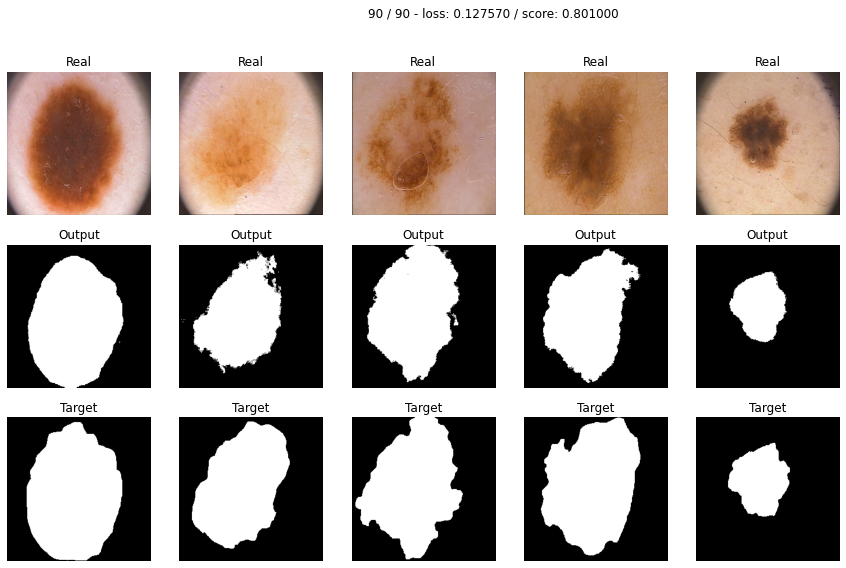

In [ ]:
max_epochs = 90
optim = torch.optim.AdamW(model.parameters(), lr = 1e-2, weight_decay=0.0001)#по State-of-the-Art CNN Optimizer for brain tumor segmentation in MRI
#optim = torch.optim.Adam(model.parameters(), lr = 1e-2)
#optim = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
history = train(model, optim, bce_loss, max_epochs, data_tr, data_val)

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
torch.save(model.state_dict(), '/content/drive/MyDrive/SegNet_BCE_scheduler_AdamW5.pth')

In [ ]:
loss_tr_bce, loss_val_bce, score_tr_bce, score_val_bce = zip(*history)

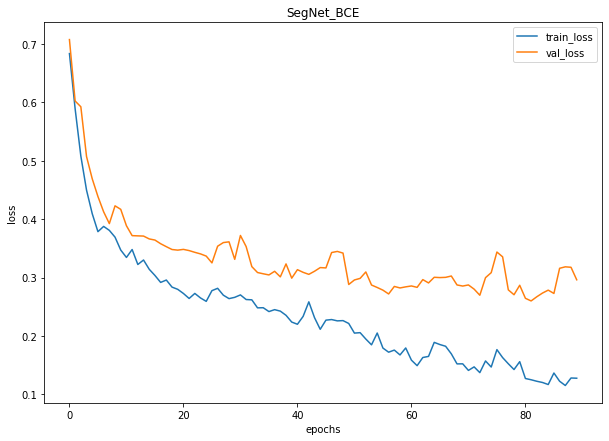

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss_tr_bce, label="train_loss")
plt.plot(loss_val_bce, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet_BCE')
plt.show()

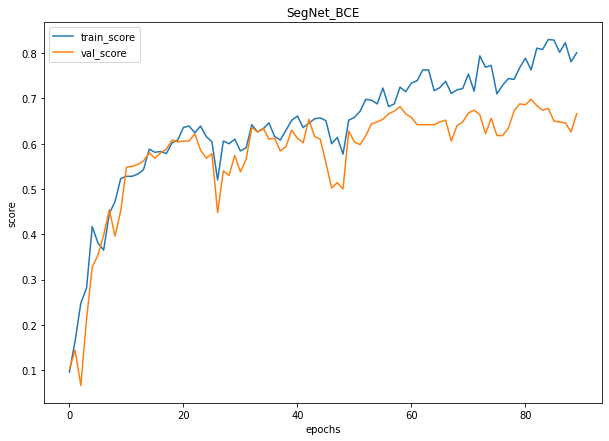

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score_tr_bce, label="train_score")
plt.plot(score_val_bce, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet_BCE')
plt.show()

## Тест

In [ ]:
def test(model, loss_fn, dataloader, epoch, device, best_acc, model_name='model'):
    avg_loss_ts = 0
    
    model.eval()
    with torch.no_grad():
        for X_ts, Y_ts in dataloader:
            Y_hat = model(X_ts.to(device)).detach().to('cpu') 

            loss_ts = loss_fn(Y_ts, Y_hat)
            avg_loss_ts += loss_ts / len(data_ts)
            score_ts = score_model(model, iou_pytorch, data_ts)

    if score_ts > best_acc:
      state = {
            'net': model.state_dict(),
            'acc': score_ts,
            'epoch': epoch,
      }
      if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
      torch.save(state, './checkpoint/ckpt_{}.pth'.format(model_name))
    
    return avg_loss_ts, score_ts

In [ ]:
def train_val(model, loss_fn, data_tr, data_val, epoch, device, best_acc, model_name='model'):
    avg_loss_tr = 0
    avg_loss_val = 0
    
    model.eval()
    with torch.no_grad():
        for X_tr, Y_tr in data_tr:
            Y_hat_tr = model(X_tr.to(device)).detach().to('cpu') 

            loss_tr = loss_fn(Y_tr, Y_hat_tr)
            avg_loss_tr += loss_tr / len(data_tr)
            score_tr = score_model(model, iou_pytorch, data_tr)
        
        for X_val, Y_val in data_val:
            Y_hat_val = model(X_val.to(device)).detach().to('cpu') 

            loss_val = loss_fn(Y_val, Y_hat_val)
            avg_loss_val += loss_val / len(data_val)
            score_val = score_model(model, iou_pytorch, data_val)
    

    if score_val > best_acc:
      state = {
            'net': model.state_dict(),
            'acc': score_val,
            'epoch': epoch,
      }
      if not os.path.isdir('checkpoint'):
            os.mkdir('checkpoint')
      torch.save(state, './checkpoint/ckpt_{}.pth'.format(model_name))
    
    return avg_loss_tr, score_tr, avg_loss_val, score_val

In [ ]:
def test_values(model, loss_fn, model_name):
  test_losses = []
  val_losses = []
  train_losses = []
  test_scores = []
  train_scores = []
  val_scores = []
  best_score = 0
  best_epoch = -1
  for i in range(10):
      train_loss, train_acc, val_loss, val_acc = train_val(model, loss_fn, data_tr, data_val, i, device, best_score, model_name)
      train_losses.append(train_loss)
      val_losses.append(val_loss)
      train_scores.append(train_acc)
      val_scores.append(val_acc)

      test_loss, test_acc = test(model, loss_fn, data_ts, i, device, best_score, model_name)
      test_losses.append(test_loss)
      test_scores.append(test_acc)

      best_score = max(best_score, test_acc)
      best_epoch = i if best_score == test_acc else best_epoch

      clear_output()
      plt.figure(figsize=(10, 7))
      plt.plot(np.arange(len(train_losses)), train_losses, label=f'Train, loss: {train_loss:.4f}, Acc: {train_acc}')
      plt.plot(np.arange(len(test_losses)), test_losses, label=f'Test, loss: {test_loss:.4f}, Acc: {test_acc}')
      plt.plot(np.arange(len(val_losses)), val_losses, label=f'Val, loss: {val_loss:.4f}, Acc: {val_acc}')
      plt.title(f'Epoch: {i}, Model: {model_name}')
      plt.legend(loc='best')
      plt.show()

  return best_score, best_epoch, torch.mean(torch.cuda.FloatTensor(test_losses)), torch.mean(torch.cuda.FloatTensor(test_scores)), train_losses, val_losses, test_losses, train_scores, val_scores, test_scores

In [ ]:
#del model
#для случаев переполнения памяти использовала ранее обученные модели, полученные на предыдущих "итерациях" процесса 
#подбора оптимальных параметров обучения; ссылки на модели также содержатся в документе со ссылкой на ноутбук
model = SegNet(3, 1).to(device)
model.load_state_dict(torch.load('/content/drive/MyDrive/SegNet_BCE_scheduler_AdamW.pth'))

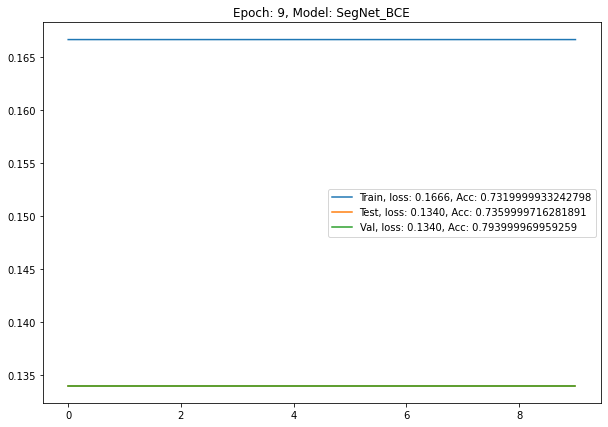

In [ ]:
best_score_bce, best_epoch_bce, mean_loss_bce, mean_score_bce, train_losses_bce, val_losses_bce, test_losses_bce, train_scores_bce, val_scores_bce, test_scores_bce = test_values(model, bce_loss, 'SegNet_BCE')

In [ ]:
best_score_bce

0.7360000312328339

In [ ]:
best_epoch_bce

3

In [ ]:
mean_loss_bce

tensor(0.1340, device='cuda:0')

In [ ]:
mean_score_bce

tensor(0.7360, device='cuda:0')

In [ ]:
score_SegNet_BCE_test = score_model2(model, iou_pytorch, data_ts)

In [ ]:
score_SegNet_BCE_test

0.7359999716281891

In [ ]:
score_SegNet_BCE_val = score_model2(model, iou_pytorch, data_val)

In [ ]:
score_SegNet_BCE_val

0.793999969959259

Ответьте себе на вопрос: не переобучается ли моя модель?

-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла] 

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss. 
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало, прежде чем бить тревогу попробуйте поперебирать различные варианты, убедитесь, что во всех других сетапах сетть достигает желанного результата. СПОЙЛЕР: учиться она будеет при всех лоссах предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \sum_i\frac{2X_iY_i}{X_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникаемой в математической формуле.


In [ ]:
def dice_loss(y_real, y_pred):
    SMOOTH = 1e-8
    y_pred = torch.sigmoid(y_pred)
    num = (y_real * y_pred).sum(dim=(1, 2, 3))
    den = (y_real + y_pred).sum(dim=(1, 2, 3))
    res = 1 - ((2. * num + SMOOTH) / (den + SMOOTH)).mean()
    return res

Проводим тестирование:

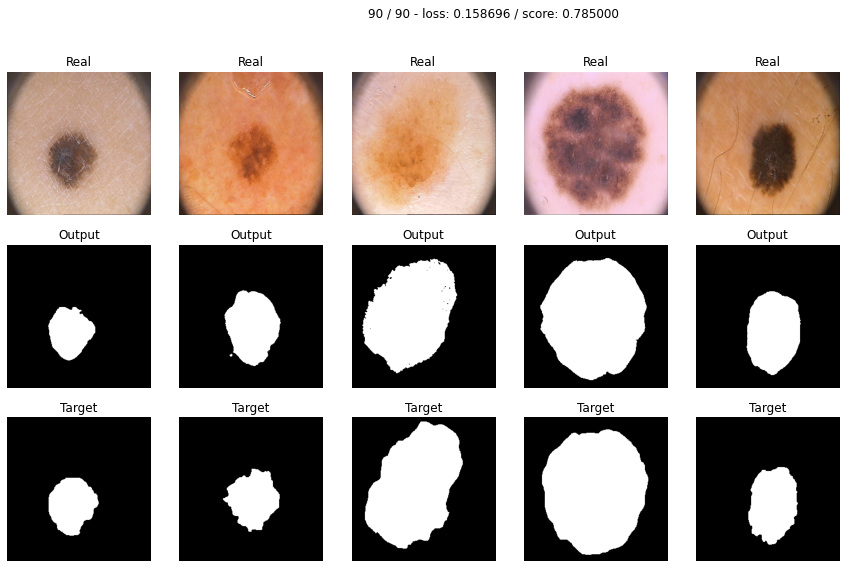

In [ ]:
model_dice = SegNet(3, 1).to(device)

optimaizer = torch.optim.AdamW(model_dice.parameters(), lr=1e-2, weight_decay=0.001)
max_epochs = 90

history2 = train(model_dice, optimaizer, dice_loss, max_epochs, data_tr, data_val)

In [ ]:
torch.save(model_dice.state_dict(), '/content/drive/MyDrive/SegNet_Dice2.pth')

In [ ]:
score_SegNet_Dice_val = score_model2(model_dice, iou_pytorch, data_val)

In [ ]:
score_SegNet_Dice_val

0.7080000042915344

In [ ]:
loss_tr_dice, loss_val_dice, score_tr_dice, score_val_dice = zip(*history2)

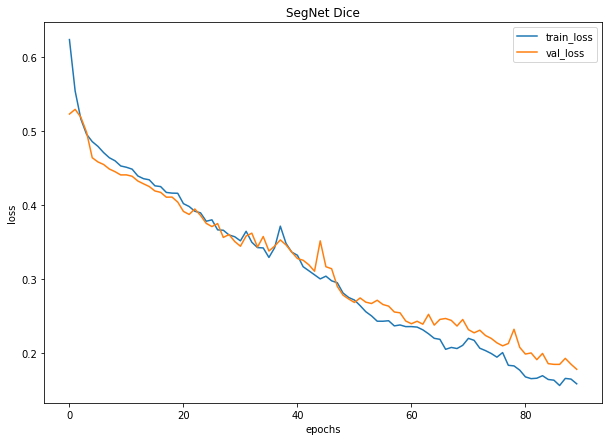

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss_tr_dice, label="train_loss")
plt.plot(loss_val_dice, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet Dice')
plt.show()

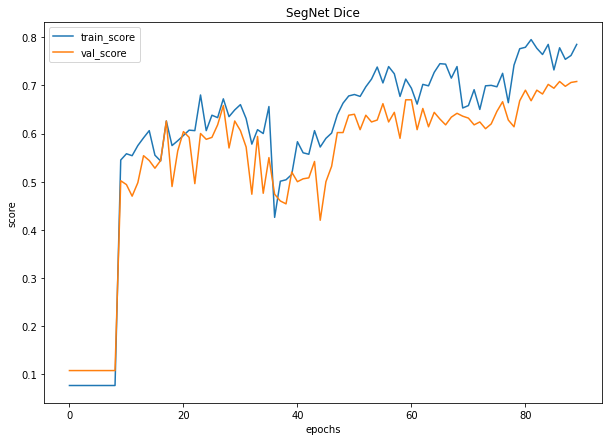

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score_tr_dice, label="train_score")
plt.plot(score_val_dice, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet Dice')
plt.show()

In [ ]:
model_dice = SegNet(3, 1).to(device)
model_dice.load_state_dict(torch.load('/content/drive/MyDrive/SegNet_Dice_scheduler_AdamW.pth'))

<All keys matched successfully>

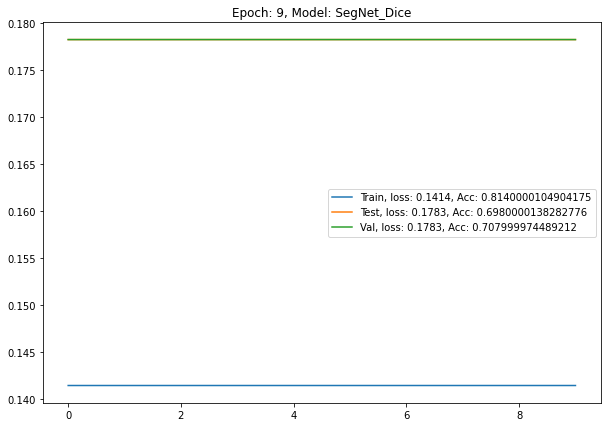

In [ ]:
best_score_dice, best_epoch_dice, mean_loss_dice, mean_score_dice, train_losses_dice, val_losses_dice, test_losses_dice, train_scores_dice, val_scores_dice, test_scores_dice = test_values(model_dice, dice_loss, 'SegNet_Dice')

In [ ]:
best_score_dice

0.6980000436306

In [ ]:
best_epoch_dice

0

In [ ]:
mean_score_dice

tensor(0.6980, device='cuda:0')

In [ ]:
mean_loss_dice

tensor(0.1783, device='cuda:0')

In [ ]:
score_SegNet_Dice_test = score_model2(model_dice, iou_pytorch, data_ts)

In [ ]:
score_SegNet_Dice_test

0.6980000138282776

In [ ]:
#del model_dice
#torch.cuda.empty_cache()

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf) 

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [ ]:
def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
    y_pred =  torch.clamp(torch.sigmoid(y_pred), eps, 1-eps)
    focal_loss = (1 - torch.exp(-1. * bce_loss(y_real, y_pred))) ** gamma * bce_loss(y_real, y_pred)    # hint: torch.clamp
    
    return focal_loss

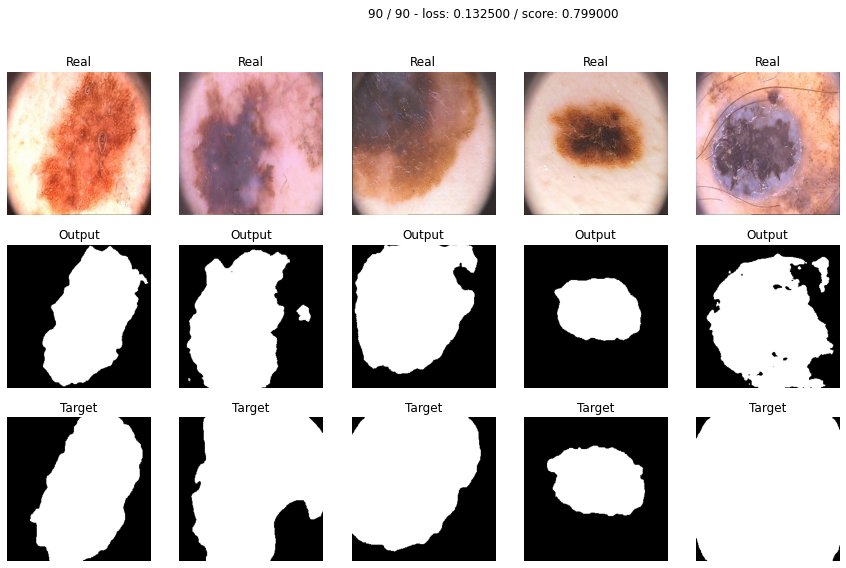

In [ ]:
model_focal = SegNet(3, 1).to(device)

max_epochs = 90
optimaizer = torch.optim.AdamW(model_focal.parameters(), lr=1e-2, weight_decay=0.001)
history3 = train(model_focal, optimaizer, focal_loss, max_epochs, data_tr, data_val)

In [ ]:
torch.save(model_focal.state_dict(), '/content/drive/MyDrive/SegNet_Focal_scheduler_AdamW2.pth')

In [ ]:
loss_tr_focal, loss_val_focal, score_tr_focal, score_val_focal = zip(*history3)

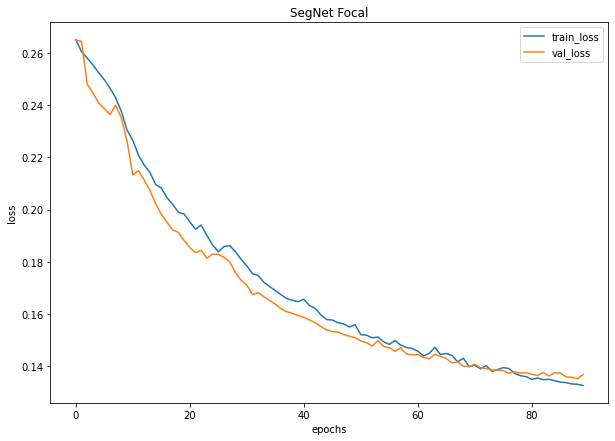

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss_tr_focal, label="train_loss")
plt.plot(loss_val_focal, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet Focal')
plt.show()

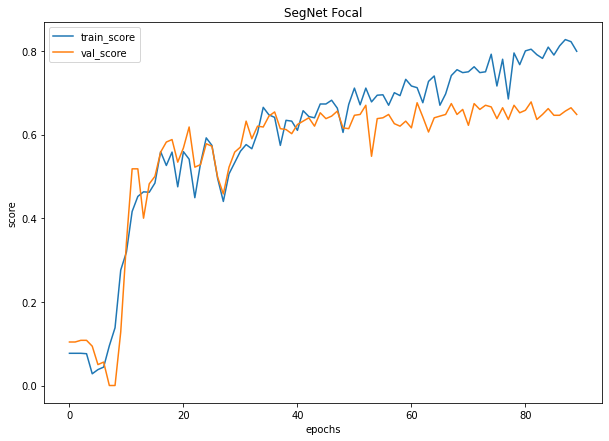

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score_tr_focal, label="train_score")
plt.plot(score_val_focal, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet Focal')
plt.show()

In [ ]:
model_focal = SegNet(3, 1).to(device)
model_focal.load_state_dict(torch.load('/content/drive/MyDrive/SegNet_Focal_scheduler_AdamW.pth'))

<All keys matched successfully>

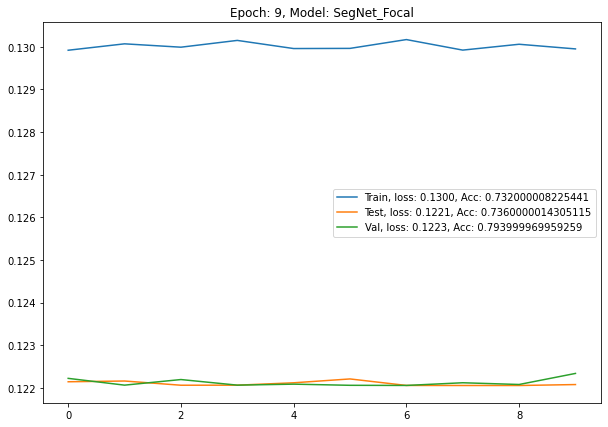

In [ ]:
best_score_focal, best_epoch_focal, mean_loss_focal, mean_score_focal, train_losses_focal, val_losses_focal, test_losses_focal, train_scores_focal, val_scores_focal, test_scores_focal = test_values(model_focal, focal_loss, 'SegNet_Focal')

In [ ]:
best_score_focal

0.7360000610351562

In [ ]:
best_epoch_focal

7

In [ ]:
mean_loss_focal

tensor(0.1221, device='cuda:0')

In [ ]:
mean_score_focal

tensor(0.7360, device='cuda:0')

In [ ]:
score_SegNet_Focal_test = score_model2(model_focal, iou_pytorch, data_ts)

In [ ]:
score_SegNet_Focal_test

0.7360000014305115

In [ ]:
score_SegNet_Focal_val = score_model2(model_focal, iou_pytorch, data_val)

In [ ]:
score_SegNet_Focal_val

0.7939999997615814

In [ ]:
#del model_focal
#torch.cuda.empty_cache()

----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты? 

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой 

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Так как Тверский лосс очень похож на данные выше, то за него будет проставлено только 3 балла (при условии, если в модели нет ошибок при обучении). Постарайтесь сделать что-то интереснее.

In [ ]:
def focal_tversky_loss(y_real, y_pred):
    y_real = y_real.to(device)
    y_pred = y_pred.to(device)
    SMOOTH = 1e-8
    ALPHA = 0.7
    BETA = 0.3
    gamma = 3/4
    y_pred = torch.sigmoid(y_pred)
    num = (y_pred * y_real).sum(dim=(1, 2, 3)) + SMOOTH
    #den = (y_pred * y_real).sum(dim=(1, 2, 3)) + ALPHA * (((torch.ones(y_pred.size()).to(device) - y_pred) * y_real).sum(dim=(1, 2, 3))) + BETA * ((y_pred * (torch.ones(y_real.size()).to(device) - y_real)).sum(dim=(1, 2, 3))) +SMOOTH
    den = (y_pred * y_real).sum(dim=(1, 2, 3)) + ALPHA * ((1 - y_pred) * y_real).sum(dim=(1, 2, 3)) + BETA * (y_pred * (1 - y_real)).sum(dim=(1, 2, 3)) + SMOOTH
    TI = (1 - (num / den)) ** (1 / gamma)
    
    return TI.mean()

In [ ]:
#del model_focal_tversky
#torch.cuda.empty_cache()
model_focal_tversky = SegNet(3, 1).to(device)

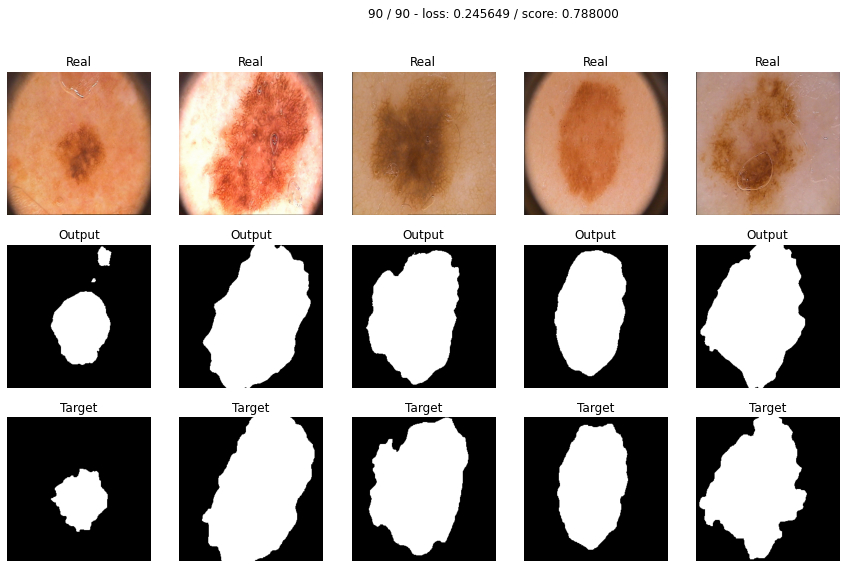

In [ ]:
max_epochs = 90
optimaizer = torch.optim.AdamW(model_focal_tversky.parameters(), lr=1e-3, weight_decay=0.0001)
history4 = train(model_focal_tversky, optimaizer, focal_tversky_loss, max_epochs, data_tr, data_val)

In [ ]:
torch.save(model_focal_tversky.state_dict(), '/content/drive/MyDrive/SegNet_Focal_Tversky_scheduler_AdamW4.pth')

In [ ]:
loss_tr_focal_tversky, loss_val_focal_tversky, score_tr_focal_tversky, score_val_focal_tversky = zip(*history4)

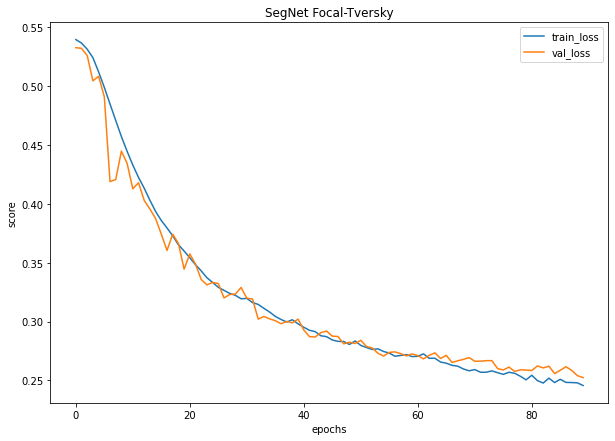

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss_tr_focal_tversky, label="train_loss")
plt.plot(loss_val_focal_tversky, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet Focal-Tversky')
plt.show()

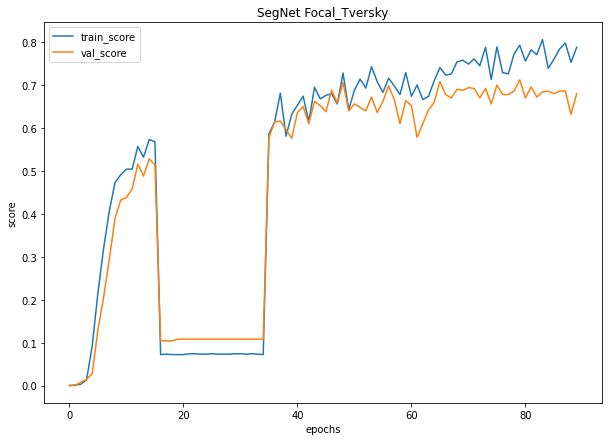

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score_tr_focal_tversky, label="train_score")
plt.plot(score_val_focal_tversky, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet Focal_Tversky')
plt.show()

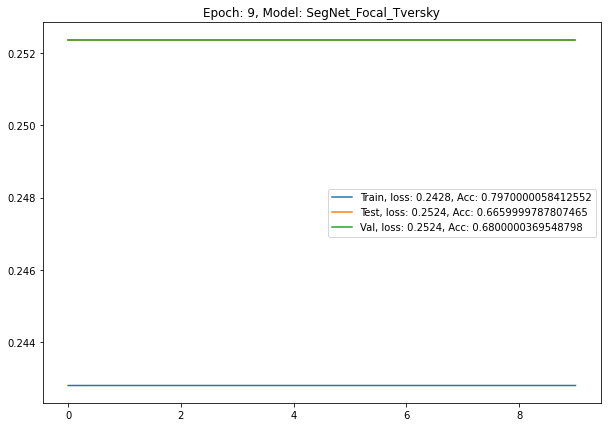

In [ ]:
best_score_focal_tversky, best_epoch_focal_tversky, mean_loss_focal_tversky, mean_score_focal_tversky, train_losses_focal_tversky, val_losses_focal_tversky, test_losses_focal_tversky, train_scores_focal_tversky, val_scores_focal_tversky, test_scores_focal_tversky = test_values(model_focal_tversky, focal_tversky_loss, 'SegNet_Focal_Tversky')

In [ ]:
best_score_focal_tversky

0.6660000085830688

In [ ]:
best_epoch_focal_tversky

6

In [ ]:
mean_loss_focal_tversky

tensor(0.2524, device='cuda:0')

In [ ]:
mean_score_focal_tversky

tensor(0.6660, device='cuda:0')

In [ ]:
score_SegNet_Focal_Tversky_val = score_model2(model_focal_tversky, iou_pytorch, data_val)

In [ ]:
score_SegNet_Focal_Tversky_val

0.6800000369548798

In [ ]:
score_SegNet_Focal_Tversky_test = score_model2(model_focal_tversky, iou_pytorch, data_ts)

In [ ]:
score_SegNet_Focal_Tversky_test

0.6660000085830688

In [ ]:
#del model_focal_tversky

Lovasz

In [ ]:
def lovasz_loss(y_real, y_pred): 
    y_pred = y_pred.view(-1)
    y_real = y_real.view(-1)

    margin_errors = 1. - y_pred * (2 * y_real - 1)
    errors_sorted, indices = torch.sort(margin_errors, dim=0, descending=True)
    y_real_sorted = y_real[indices.data]
    
    intersection = y_real_sorted.sum() - y_real_sorted.cumsum(0)
    union = y_real_sorted.sum() + (1. - y_real_sorted).cumsum(0)
    jaccard = 1. - intersection / union

    p = len(y_real_sorted)
    if p > 1:
      jaccard[1:p] = jaccard[1:p] - jaccard[0:-1]

    res = torch.dot(F.relu(errors_sorted), jaccard)

    return res

In [ ]:
#del model_lovasz

In [ ]:
model_lovasz = SegNet(3, 1).to(device)

In [ ]:
torch.manual_seed(1)

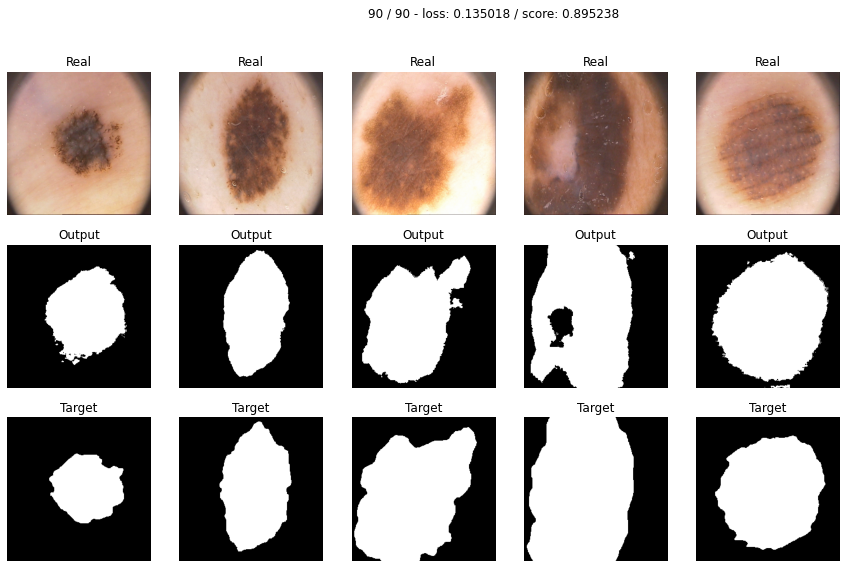

In [ ]:
max_epochs = 90
optimaizer = torch.optim.Adam(model_lovasz.parameters(), lr=1e-3)
history9 = train(model_lovasz, optimaizer, lovasz_loss, max_epochs, data_tr, data_val)

In [ ]:
torch.save(model_lovasz.state_dict(), '/content/drive/MyDrive/SegNet_Lovasz.pth')

In [ ]:
model_lovasz = SegNet(3, 1).to(device)

In [ ]:
loss_tr_lovasz,loss_val_lovasz, score_tr_lovasz, score_val_lovasz = zip(*history9)

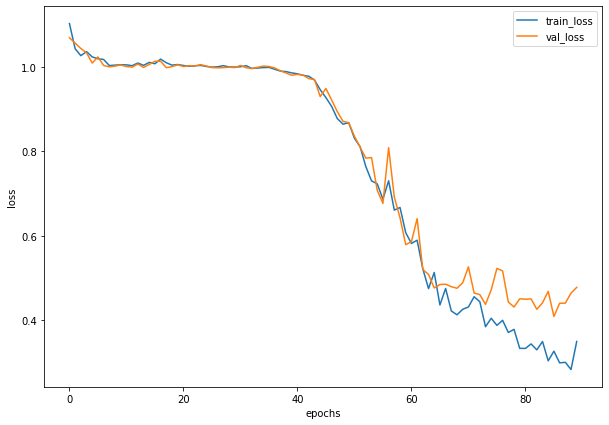

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss_tr_lovasz, label="train_loss")
plt.plot(loss_val_lovasz, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

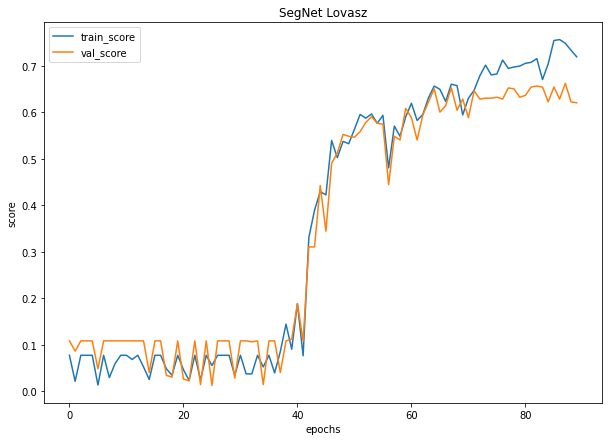

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score_tr_lovasz, label="train_score")
plt.plot(score_val_lovasz, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet Lovasz')
plt.show()

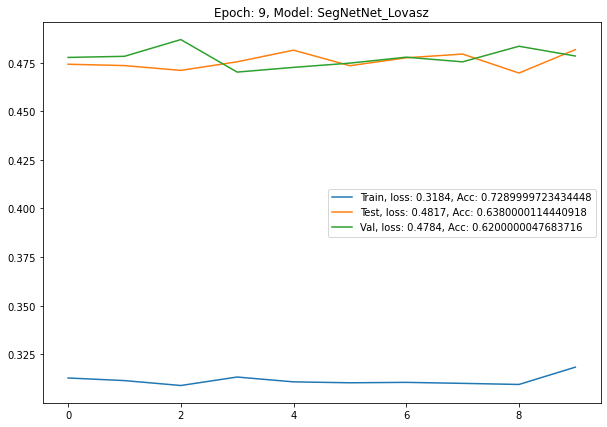

In [ ]:
best_score_lovasz, best_epoch_lovasz, mean_loss_lovasz, mean_score_lovasz, train_losses_lovasz, val_losses_lovasz, test_losses_lovasz, train_scores_lovasz, val_scores_lovasz, test_scores_lovasz = test_values(model_lovasz, lovasz_loss, 'SegNetNet_Lovasz')

In [ ]:
best_score_lovasz

0.6380000412464142

In [ ]:
best_epoch_lovasz

3

In [ ]:
mean_loss_lovasz

tensor(0.4757, device='cuda:0')

In [ ]:
mean_score_lovasz

tensor(0.6380, device='cuda:0')

In [ ]:
score_SegNet_Lovasz_val = score_model2(model_lovasz, iou_pytorch, data_val)

In [ ]:
score_SegNet_Lovasz_val

0.6200000047683716

In [ ]:
score_SegNet_Lovasz_test = score_model2(model_lovasz, iou_pytorch, data_ts)

In [ ]:
score_SegNet_Lovasz_test

0.6379999816417694

In [ ]:
#Вероятно, 90 эпох недостаточно для обучения с функцией потер Lovasz(резуьтаты обучения здесь - для уже предобученной на прошлой итерации модели SegNet_Lovasz модели)
#Графики для Lovasz в данном случае использовались от предыдущих итераций, до переполнения

Сравнение показателей для всех функций потерь; SegNet

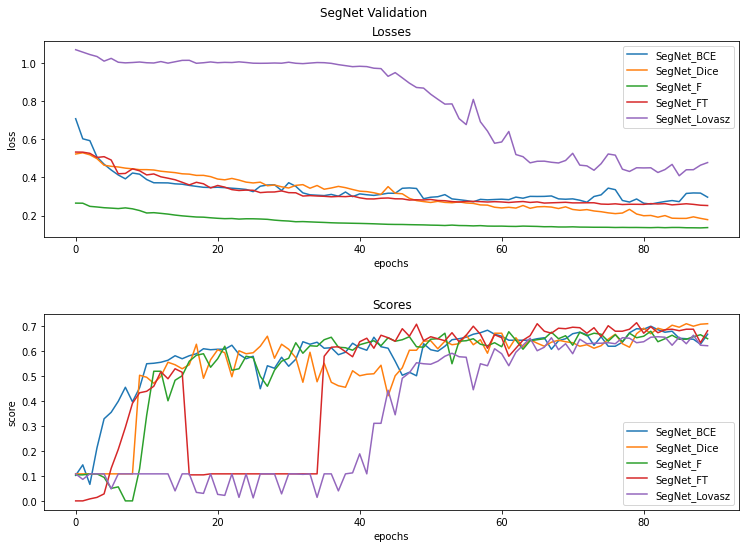

In [ ]:
 plt.rcParams['figure.figsize'] = (11, 8)
 fig, a = plt.subplots(2, 1)
 plt.sca(a[0])
 plt.plot(loss_val_bce, label="SegNet_BCE")
 plt.plot(loss_val_dice, label="SegNet_Dice")
 plt.plot(loss_val_focal, label='SegNet_F')
 plt.plot(loss_val_focal_tversky, label='SegNet_FT')
 plt.plot(loss_val_lovasz, label='SegNet_Lovasz')
 plt.legend(loc='best')
 plt.xlabel("epochs")
 plt.ylabel("loss")
 plt.title('Losses')
 plt.sca(a[1])
 plt.plot(score_val_bce, label="SegNet_BCE")
 plt.plot(score_val_dice, label="SegNet_Dice")
 plt.plot(score_val_focal, label='SegNet_F')
 plt.plot(score_val_focal_tversky, label='SegNet_FT')
 plt.plot(score_val_lovasz, label='SegNet_Lovasz')
 plt.legend(loc='best')
 plt.xlabel("epochs")
 plt.ylabel("score")
 plt.title('Scores')
 plt.suptitle('SegNet Validation')
 fig.tight_layout(pad=3.0)

In [ ]:
segnet_scores_val = {
    'model_name': ['SegNet_BCE', 'SegNet_Dice', 'SegNet_F', 'SegNet_FT', 'SegNet_L'],
    'score': [score_SegNet_BCE_val, score_SegNet_Dice_val, score_SegNet_Focal_val, score_SegNet_Focal_Tversky_val, score_SegNet_Lovasz_val]
  }

In [ ]:
segnet_scores_ts = {
    'model_name': ['SegNet_BCE', 'SegNet_Dice', 'SegNet_F', 'SegNet_FT', 'SegNet_L'],
    'score': [score_SegNet_BCE_test, score_SegNet_Dice_test, score_SegNet_Focal_test, score_SegNet_Focal_Tversky_test, score_SegNet_Lovasz_test]
  }

In [ ]:
segnet_scores_val_df = pd.DataFrame(data=segnet_scores_val)
segnet_scores_ts_df = pd.DataFrame(data=segnet_scores_ts)

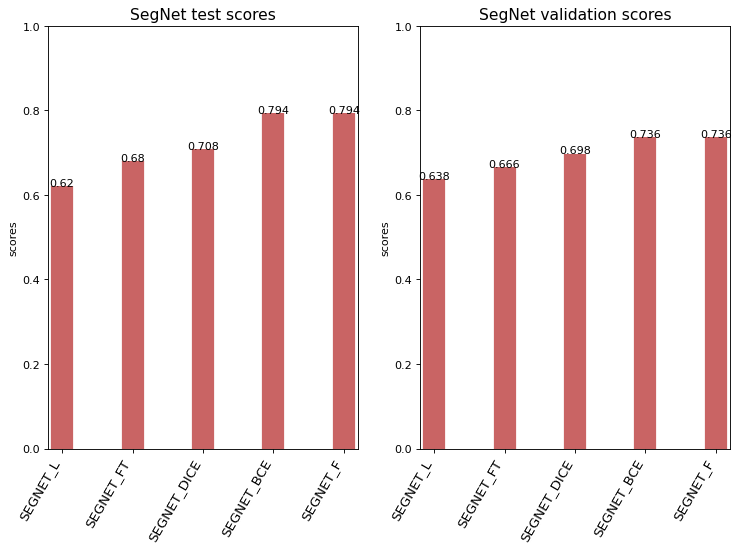

In [ ]:
segnet_scores_val_df.sort_values('score', inplace=True)
segnet_scores_ts_df.sort_values('score', inplace=True)
segnet_scores_val_df.reset_index(inplace=True)
segnet_scores_ts_df.reset_index(inplace=True)

import matplotlib.patches as patches

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(11,7), facecolor='white', dpi= 80, sharex=False)
ax0.vlines(x=segnet_scores_val_df.index, ymin=0, ymax=segnet_scores_val_df.score, color='firebrick', alpha=0.7, linewidth=20)
ax1.vlines(x=segnet_scores_ts_df.index, ymin=0, ymax=segnet_scores_ts_df.score, color='firebrick', alpha=0.7, linewidth=20)

for i, score in enumerate(segnet_scores_val_df.score):
    ax0.text(i, score, round(score, 6), horizontalalignment='center')

for i, score in enumerate(segnet_scores_ts_df.score):
    ax1.text(i, score, round(score, 6), horizontalalignment='center')


ax0.set_title('SegNet test scores', fontdict={'size':14})
ax0.set(ylabel='scores', ylim=(0, 1))
ax0.set_xticklabels(segnet_scores_ts_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)
ax0.set_xticks(segnet_scores_ts_df.index)


ax1.set_title('SegNet validation scores', fontdict={'size':14})
ax1.set(ylabel='scores', ylim=(0, 1))
ax1.set_xticks(segnet_scores_val_df.index)
ax1.set_xticklabels(segnet_scores_val_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)

plt.show()

# SegNet2 BCE


SegNet2 соответствует схеме из статьи, отсутствует "bottleneck 1-3-1"



In [ ]:
model2 = SegNet2(3, 1).to(device)

In [ ]:
#del model2

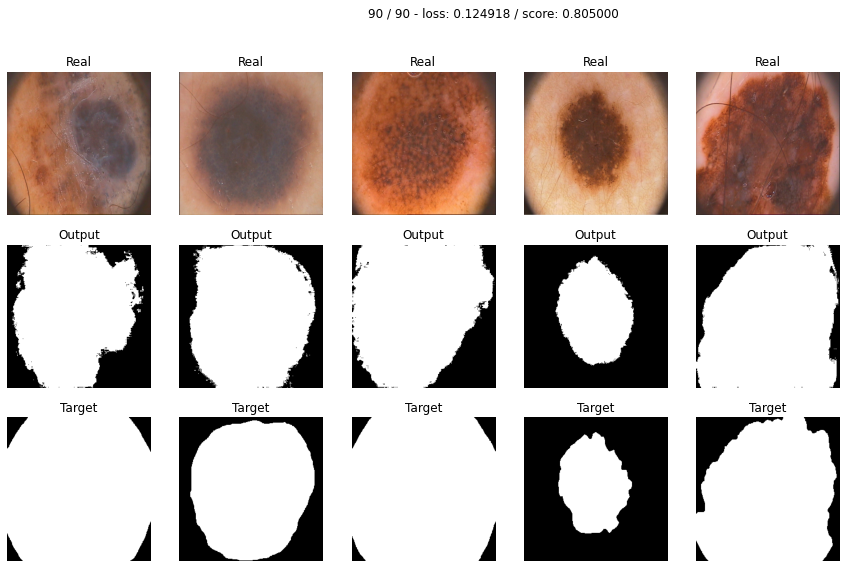

In [ ]:
max_epochs = 90
optimaizer = torch.optim.Adam(model2.parameters(), lr=1e-2)
history2_2 = train(model2, optimaizer, bce_loss, max_epochs, data_tr, data_val)

In [ ]:
torch.save(model2.state_dict(), '/content/drive/MyDrive/SegNet2_BCE.pth')

In [ ]:
loss2_tr_bce,loss2_val_bce, score2_tr_bce, score2_val_bce = zip(*history2_2)

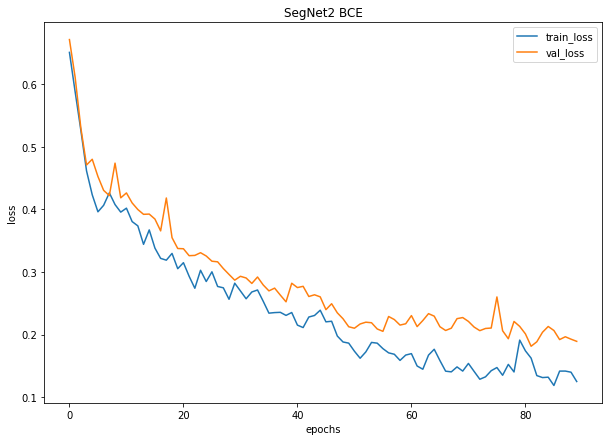

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss2_tr_bce, label="train_loss")
plt.plot(loss2_val_bce, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet2 BCE')
plt.show()

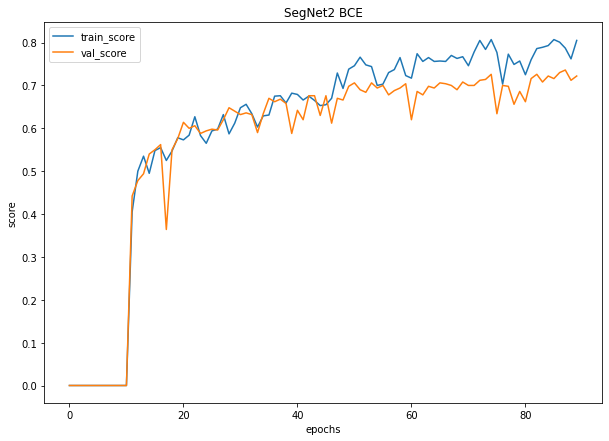

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score2_tr_bce, label="train_score")
plt.plot(score2_val_bce, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet2 BCE')
plt.show()

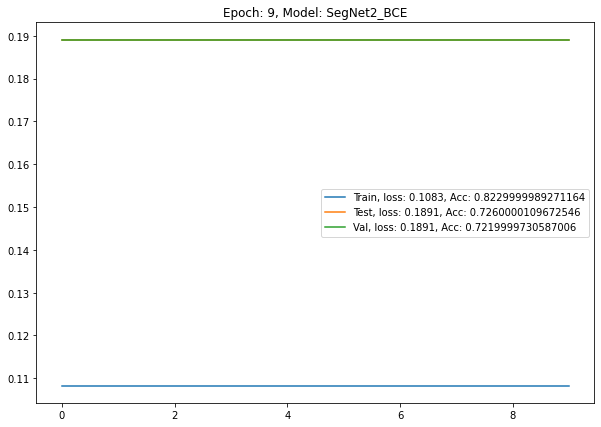

In [ ]:
best_score2_bce, best_epoch2_bce, mean_loss2_bce, mean_score2_bce, train_losses2_bce, val_losses2_bce, test_losses2_bce, train_scores2_bce, val_scores2_bce, test_scores2_bce = test_values(model2, bce_loss, 'SegNet2_BCE')

In [ ]:
best_score2_bce

0.726000040769577

In [ ]:
best_epoch2_bce

0

In [ ]:
mean_loss2_bce

tensor(0.1891, device='cuda:0')

In [ ]:
mean_score2_bce

tensor(0.7260, device='cuda:0')

In [ ]:
score_SegNet2_BCE_val = score_model2(model2, iou_pytorch, data_val)

In [ ]:
score_SegNet2_BCE_val

0.7219999730587006

In [ ]:
score_SegNet2_BCE_test = score_model2(model2, iou_pytorch, data_ts)

In [ ]:
score_SegNet2_BCE_test

0.7260000109672546

# SegNet2 Dice

In [ ]:
model2_dice = SegNet2(3, 1).to(device)

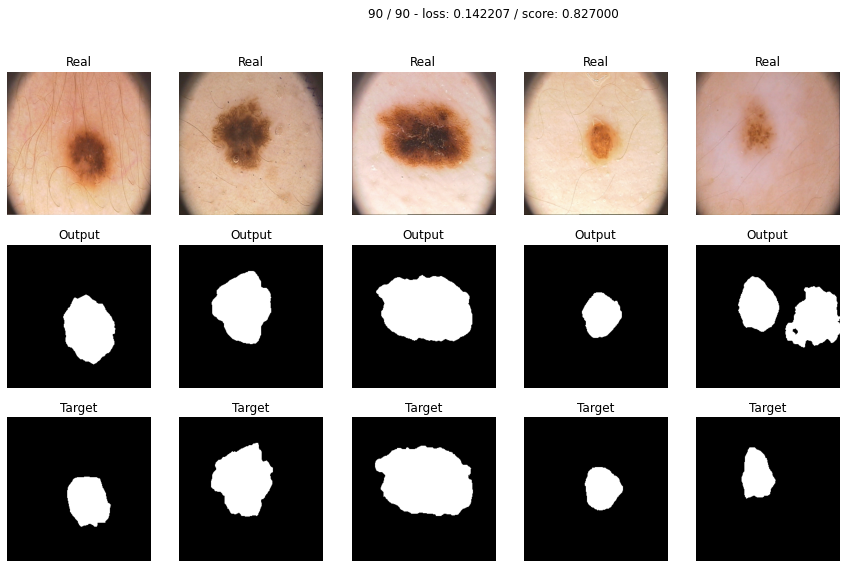

In [ ]:
max_epochs = 90
optimaizer = torch.optim.AdamW(model2_dice.parameters(), lr=1e-2)
history2_3 = train(model2_dice, optimaizer, dice_loss, max_epochs, data_tr, data_val)

In [ ]:
loss2_tr_dice, loss2_val_dice, score2_tr_dice, score2_val_dice = zip(*history2_3)

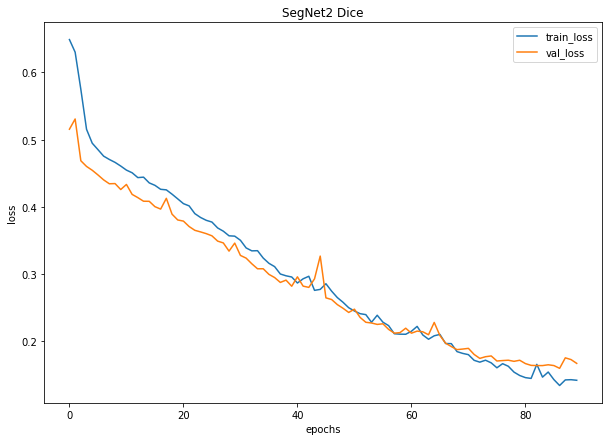

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss2_tr_dice, label="train_loss")
plt.plot(loss2_val_dice, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet2 Dice')
plt.show()

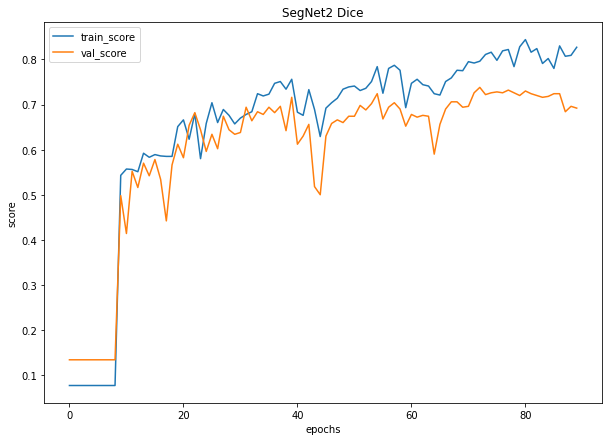

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score2_tr_dice, label="train_score")
plt.plot(score2_val_dice, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet2 Dice')
plt.show()

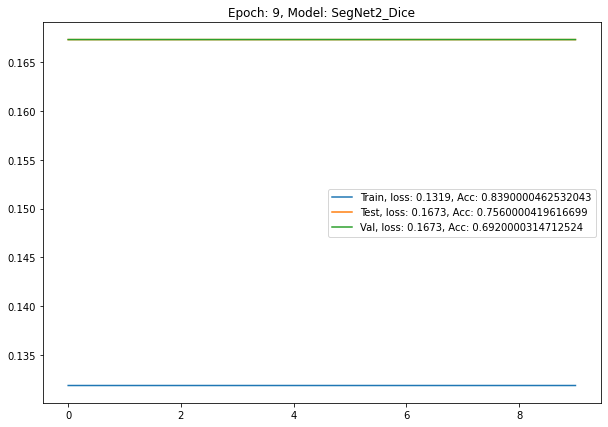

In [ ]:
best_score2_dice, best_epoch2_dice, mean_loss2_dice, mean_score2_dice, train_losses2_dice, val_losses2_dice, test_losses2_dice, train_scores2_dice, val_scores2_dice, test_scores2_dice = test_values(model2_dice, dice_loss, 'SegNet2_Dice')

In [ ]:
best_score2_dice

0.7560000419616699

In [ ]:
best_epoch2_dice

9

In [ ]:
mean_loss2_dice

tensor(0.1673, device='cuda:0')

In [ ]:
mean_score2_dice

tensor(0.7560, device='cuda:0')

In [ ]:
score_SegNet2_Dice_val = score_model2(model2_dice, iou_pytorch, data_val)

In [ ]:
score_SegNet2_Dice_val

0.6919999420642853

In [ ]:
score_SegNet2_Dice_test = score_model2(model2_dice, iou_pytorch, data_ts)

In [ ]:
score_SegNet2_Dice_test

0.7559999823570251

In [ ]:
#del model2_dice
#torch.cuda.empty_cache()

# SegNet2 Focal

In [ ]:
model2_focal = SegNet2(3, 1).to(device)

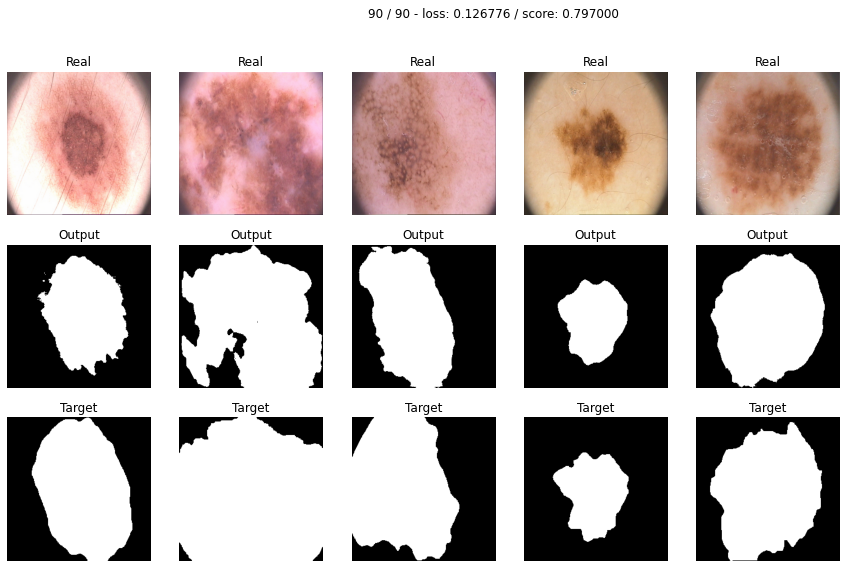

In [ ]:
max_epochs = 90
optimaizer = torch.optim.AdamW(model2_focal.parameters(), lr=1e-2)
history2_4 = train(model2_focal, optimaizer, focal_loss, max_epochs, data_tr, data_val)

In [ ]:
loss2_tr_focal, loss2_val_focal, score2_tr_focal, score2_val_focal = zip(*history2_4)

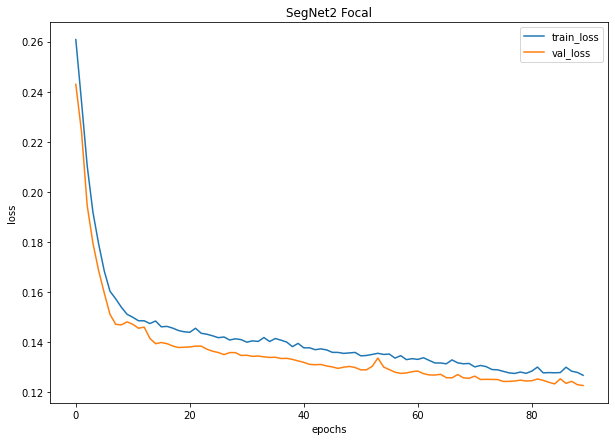

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss2_tr_focal, label="train_loss")
plt.plot(loss2_val_focal, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet2 Focal')
plt.show()

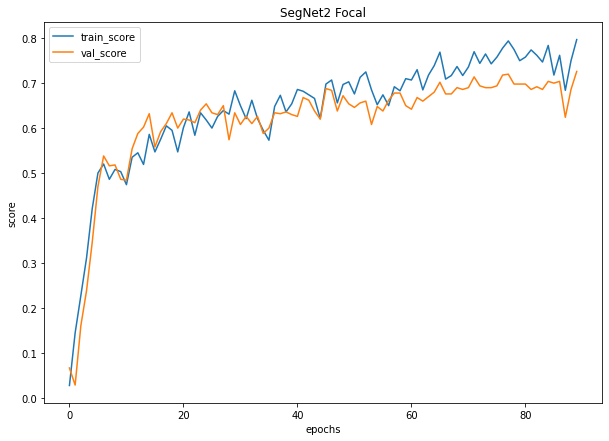

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score2_tr_focal, label="train_score")
plt.plot(score2_val_focal, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet2 Focal')
plt.show()

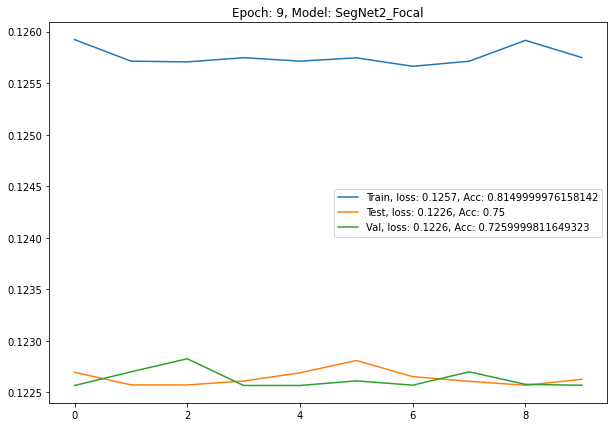

In [ ]:
best_score2_focal, best_epoch2_focal, mean_loss2_focal, mean_score2_focal, train_losses2_focal, val_losses2_focal, test_losses2_focal, train_scores2_focal, val_scores2_focal, test_scores2_focal = test_values(model2_focal, focal_loss, 'SegNet2_Focal')

In [ ]:
best_score2_focal

0.75

In [ ]:
best_epoch2_focal

9

In [ ]:
mean_loss2_focal

tensor(0.1226, device='cuda:0')

In [ ]:
mean_score2_focal

tensor(0.7500, device='cuda:0')

In [ ]:
score_SegNet2_Focal_val = score_model2(model2_focal, iou_pytorch, data_val)

In [ ]:
score_SegNet2_Focal_val

0.7260000109672546

In [ ]:
score_SegNet2_Focal_test = score_model2(model2_focal, iou_pytorch, data_ts)

In [ ]:
score_SegNet2_Focal_test

0.75

In [ ]:
#del model2_focal
#torch.cuda.empty_cache()

# SegNet2 Focal_Tversky

In [ ]:
model2_focal_tversky = SegNet2(3, 1).to(device)

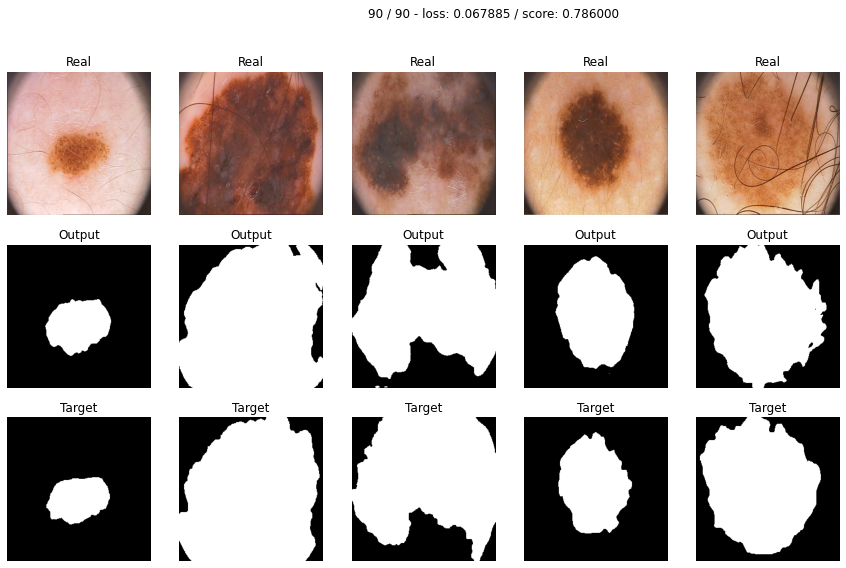

In [ ]:
max_epochs = 90
optimaizer = torch.optim.Adam(model2_focal_tversky.parameters(), lr=1e-2)
history2_5 = train(model2_focal_tversky, optimaizer, focal_tversky_loss, max_epochs, data_tr, data_val)

In [ ]:
torch.save(model2_focal_tversky.state_dict(), '/content/drive/MyDrive/SegNet2_FT.pth')

In [ ]:
loss2_tr_focal_tversky, loss2_val_focal_tversky, score2_tr_focal_tversky, score2_val_focal_tversky = zip(*history2_5)

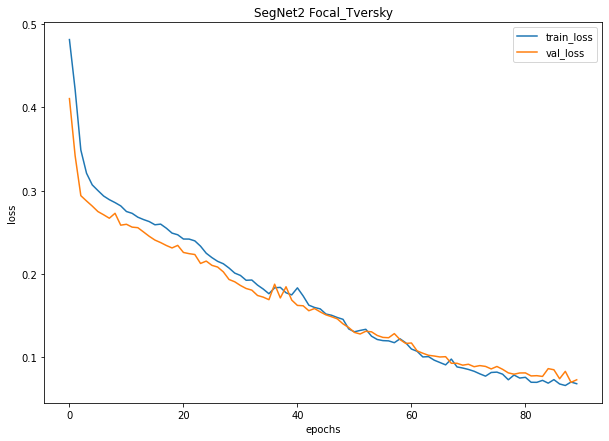

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss2_tr_focal_tversky, label="train_loss")
plt.plot(loss2_val_focal_tversky, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet2 Focal_Tversky')
plt.show()

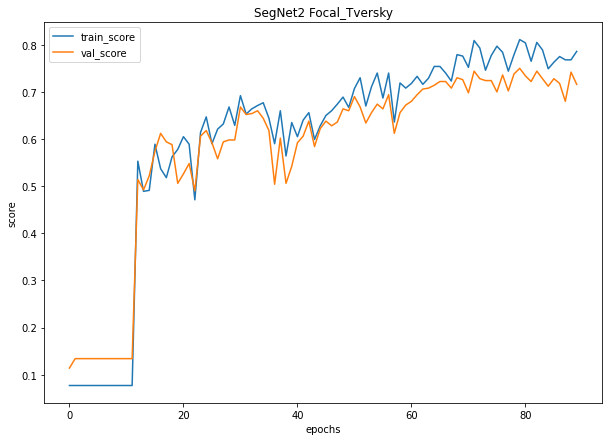

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score2_tr_focal_tversky, label="train_score")
plt.plot(score2_val_focal_tversky, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet2 Focal_Tversky')
plt.show()

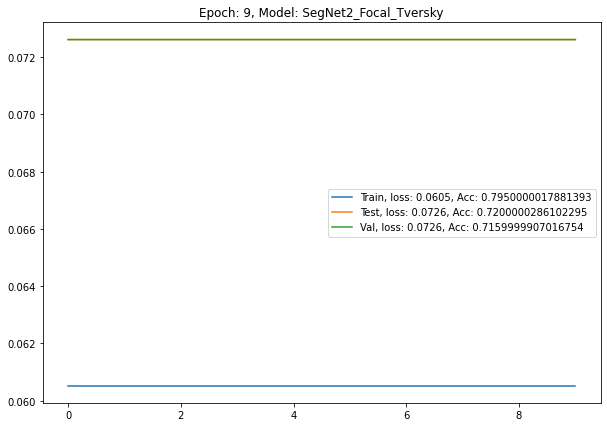

In [ ]:
best_score2_focal_tversky, best_epoch2_focal_tversky, mean_loss2_focal_tversky, mean_score2_focal_tversky, train_losses2_focal_tversky, val_losses2_focal_tversky, test_losses2_focal_tversky, train_scores2_focal_tversky, val_scores2_focal_tversky, test_scores2_focal_tversky = test_values(model2_focal_tversky, focal_tversky_loss, 'SegNet2_Focal_Tversky')

In [ ]:
best_score2_focal_tversky

0.7200000286102295

In [ ]:
best_epoch2_focal_tversky

9

In [ ]:
mean_loss2_focal_tversky

tensor(0.0726, device='cuda:0')

In [ ]:
mean_score2_focal_tversky

tensor(0.7200, device='cuda:0')

In [ ]:
score_SegNet2_Focal_Tversky_val = score_model2(model2_focal_tversky, iou_pytorch, data_val)

In [ ]:
score_SegNet2_Focal_Tversky_val

0.7160000205039978

In [ ]:
score_SegNet2_Focal_Tversky_test = score_model2(model2_focal_tversky, iou_pytorch, data_ts)

In [ ]:
score_SegNet2_Focal_Tversky_test

0.7199999988079071

In [ ]:
#del model2_focal_tversky
#torch.cuda.empty_cache()

# SegNet2 Lovasz

In [ ]:
model2_lovasz = SegNet2(3, 1).to(device)

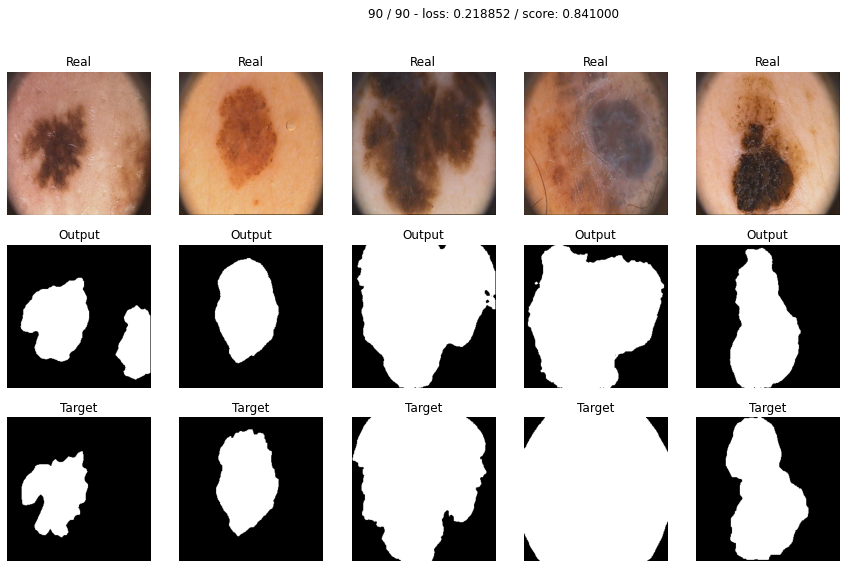

In [ ]:
max_epochs = 90
optimaizer = torch.optim.Adam(model2_lovasz.parameters(), lr=1e-2)
history2_6 = train(model2_lovasz, optimaizer, lovasz_loss, max_epochs, data_tr, data_val)

In [ ]:
loss2_tr_lovasz, loss2_val_lovasz, score2_tr_lovasz, score2_val_lovasz = zip(*history2_6)

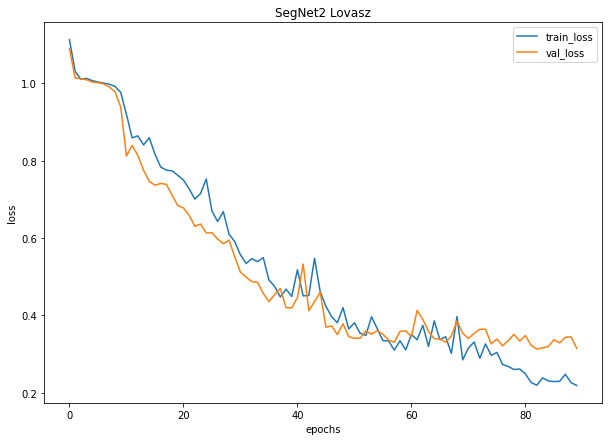

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(loss2_tr_lovasz, label="train_loss")
plt.plot(loss2_val_lovasz, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('SegNet2 Lovasz')
plt.show()

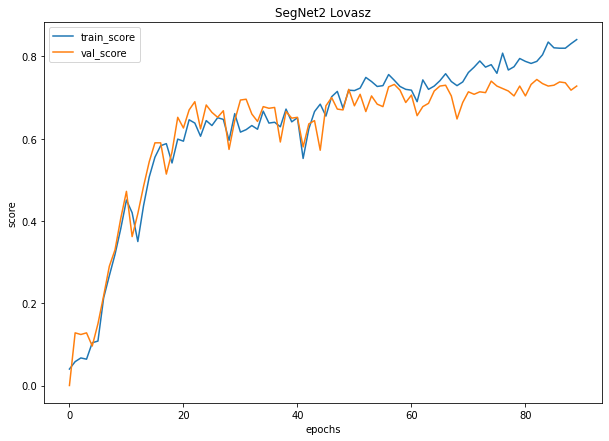

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(score2_tr_lovasz, label="train_score")
plt.plot(score2_val_lovasz, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('SegNet2 Lovasz')
plt.show()

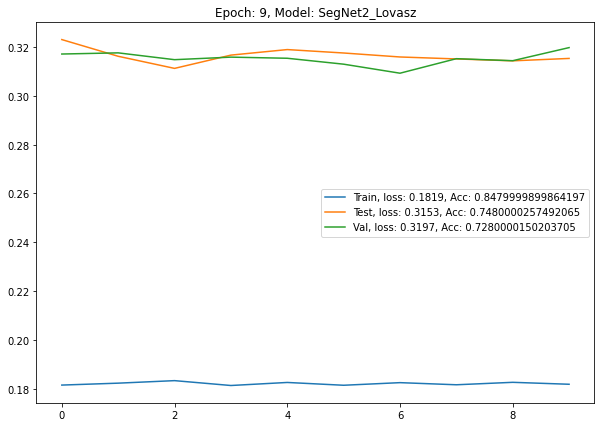

In [ ]:
best_score2_lovasz, best_epoch2_lovasz, mean_loss2_lovasz, mean_score2_lovasz, train_losses2_lovasz, val_losses2_lovasz, test_losses2_lovasz, train_scores2_lovasz, val_scores2_lovasz, test_scores2_lovasz = test_values(model2_lovasz, lovasz_loss, 'SegNet2_Lovasz')

In [ ]:
best_score2_lovasz

0.7480000257492065

In [ ]:
best_epoch2_lovasz

9

In [ ]:
mean_loss2_lovasz

tensor(0.3164, device='cuda:0')

In [ ]:
mean_score2_lovasz

tensor(0.7480, device='cuda:0')

In [ ]:
score_SegNet2_Lovasz_val = score_model2(model2_lovasz, iou_pytorch, data_val)

In [ ]:
score_SegNet2_Lovasz_val

0.7280000150203705

In [ ]:
score_SegNet2_Lovasz_test = score_model2(model2_lovasz, iou_pytorch, data_ts)

In [ ]:
score_SegNet2_Lovasz_test

0.7479999661445618

Сравнение показателей для всех функций потерь; SegNet2

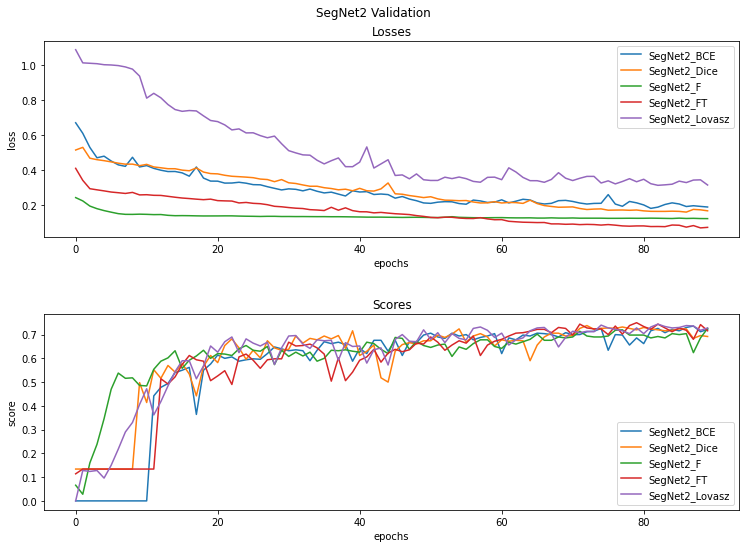

In [ ]:
 plt.rcParams['figure.figsize'] = (11, 8)
 fig, a = plt.subplots(2, 1)
 plt.sca(a[0])
 plt.plot(loss2_val_bce, label="SegNet2_BCE")
 plt.plot(loss2_val_dice, label="SegNet2_Dice")
 plt.plot(loss2_val_focal, label='SegNet2_F')
 plt.plot(loss2_val_focal_tversky, label='SegNet2_FT')
 plt.plot(loss2_val_lovasz, label='SegNet2_Lovasz')
 plt.legend(loc='best')
 plt.xlabel("epochs")
 plt.ylabel("loss")
 plt.title('Losses')
 plt.sca(a[1])
 plt.plot(score2_val_bce, label="SegNet2_BCE")
 plt.plot(score2_val_dice, label="SegNet2_Dice")
 plt.plot(score2_val_focal, label='SegNet2_F')
 plt.plot(score2_val_focal_tversky, label='SegNet2_FT')
 plt.plot(score2_val_lovasz, label='SegNet2_Lovasz')
 plt.legend(loc='best')
 plt.xlabel("epochs")
 plt.ylabel("score")
 plt.title('Scores')
 plt.suptitle('SegNet2 Validation')
 fig.tight_layout(pad=3.0)

In [ ]:
segnet2_scores_val = {
    'model_name': ['SegNet2_BCE', 'SegNet2_Dice', 'SegNet2_F', 'SegNet2_FT', 'SegNet2_L'],
    'score': [score_SegNet2_BCE_val, score_SegNet2_Dice_val, score_SegNet2_Focal_val, score_SegNet2_Focal_Tversky_val, score_SegNet2_Lovasz_val]
  }

In [ ]:
segnet2_scores_ts = {
    'model_name': ['SegNet2_BCE', 'SegNet2_Dice', 'SegNet2_F', 'SegNet2_FT', 'SegNet2_L'],
    'score': [score_SegNet2_BCE_test, score_SegNet2_Dice_test, score_SegNet2_Focal_test, score_SegNet2_Focal_Tversky_test, score_SegNet2_Lovasz_test]
  }

In [ ]:
segnet2_scores_val_df = pd.DataFrame(data=segnet2_scores_val)
segnet2_scores_ts_df = pd.DataFrame(data=segnet2_scores_ts)

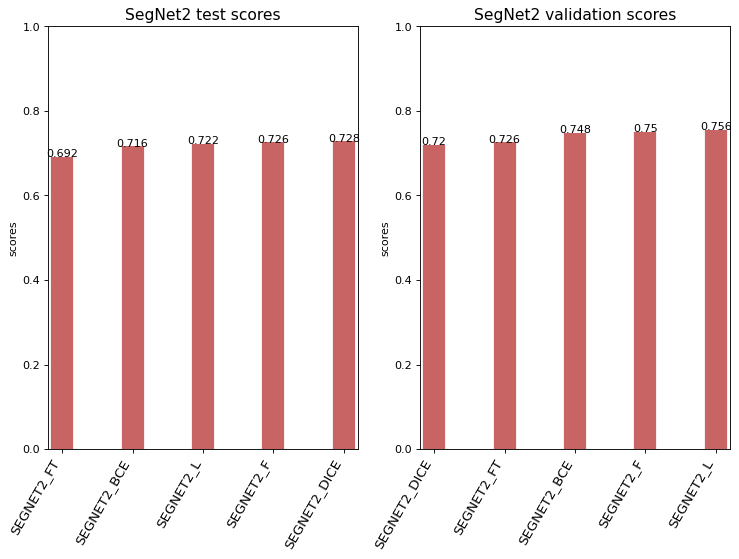

In [ ]:
segnet2_scores_val_df.sort_values('score', inplace=True)
segnet2_scores_ts_df.sort_values('score', inplace=True)
segnet2_scores_val_df.reset_index(inplace=True)
segnet2_scores_ts_df.reset_index(inplace=True)


fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(11,7), facecolor='white', dpi= 80, sharex=False)
ax0.vlines(x=segnet2_scores_val_df.index, ymin=0, ymax=segnet2_scores_val_df.score, color='firebrick', alpha=0.7, linewidth=20)
ax1.vlines(x=segnet2_scores_ts_df.index, ymin=0, ymax=segnet2_scores_ts_df.score, color='firebrick', alpha=0.7, linewidth=20)

for i, score in enumerate(segnet2_scores_val_df.score):
    ax0.text(i, score, round(score, 6), horizontalalignment='center')

for i, score in enumerate(segnet2_scores_ts_df.score):
    ax1.text(i, score, round(score, 6), horizontalalignment='center')

ax0.set_title('SegNet2 test scores', fontdict={'size':14})
ax0.set(ylabel='scores', ylim=(0, 1))
ax0.set_xticklabels(segnet2_scores_ts_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)
ax0.set_xticks(segnet2_scores_ts_df.index)


ax1.set_title('SegNet2 validation scores', fontdict={'size':14})
ax1.set(ylabel='scores', ylim=(0, 1))
ax1.set_xticks(segnet2_scores_val_df.index)
ax1.set_xticklabels(segnet2_scores_val_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)

plt.show()

In [ ]:
#del model2_lovasz

-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Учитывая медицинское изображение, он выводит изображение в оттенках серого, представляющее вероятность того, что каждый пиксель является интересующей областью.

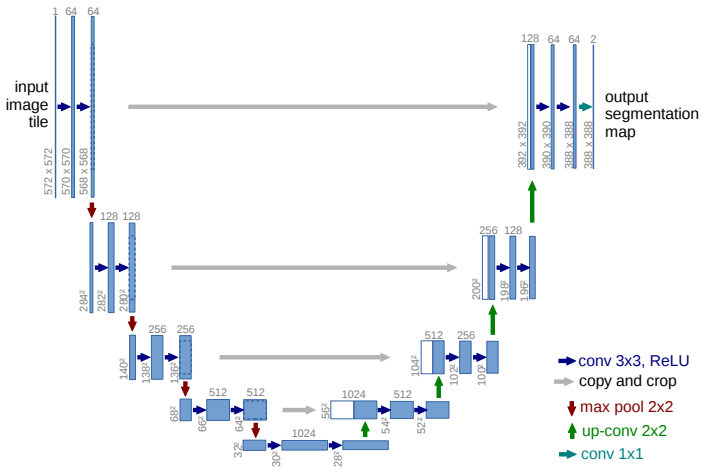

У нас в архитектуре все так же существует енкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются skip-conenctions. Элементы соединяющие части декодера и енкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [ ]:
def init_weights(m):
    if type(m) == nn.Linear:
        torch.nn.init.xavier_uniform(m.weight)
        m.bias.data.fill_(0.01)


class DoubleConv(nn.Module):
    
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv.apply(init_weights)(x)


class Down(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv.apply(init_weights)(x)


class Up(nn.Module):

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        #if bilinear:
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)


    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv.apply(init_weights)(x)


class Up2(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()

      
        self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)


    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv.apply(init_weights)(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv.apply(init_weights)(x)

In [ ]:
class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=1, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        
        return logits

# UNet BCE

In [ ]:
unet_model = UNet().to(device)

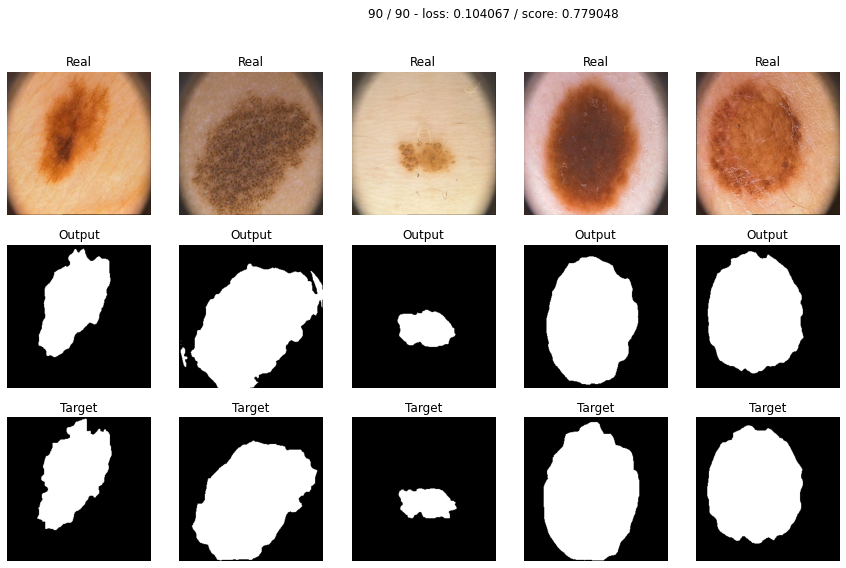

In [ ]:
history5 = train(unet_model, optim.Adam(unet_model.parameters()), bce_loss, 90, data_tr, data_val)

In [ ]:
u_loss_tr_bce, u_loss_val_bce, u_score_tr_bce, u_score_val_bce = zip(*history5)

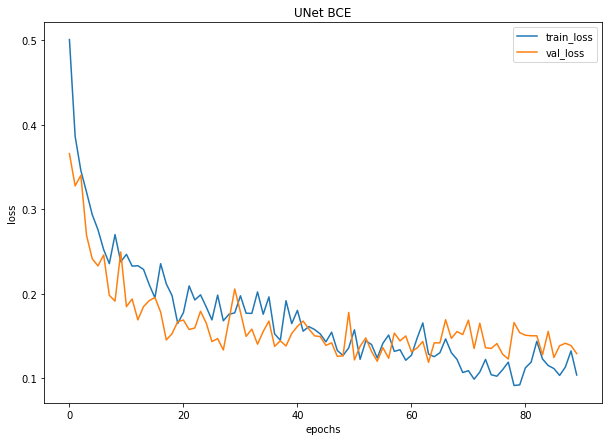

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_loss_tr_bce, label="train_loss")
plt.plot(u_loss_val_bce, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet BCE')
plt.show()

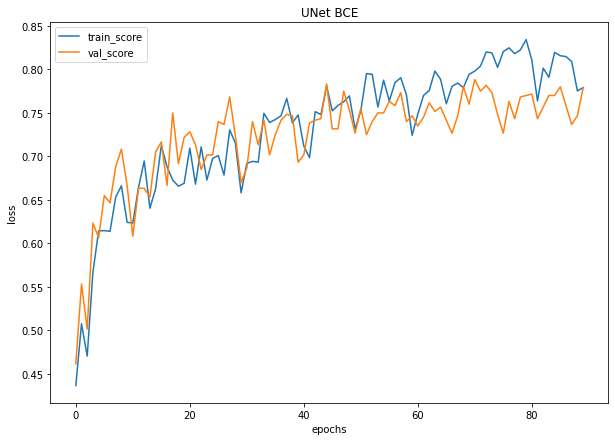

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_score_tr_bce, label="train_score")
plt.plot(u_score_val_bce, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet BCE')
plt.show()

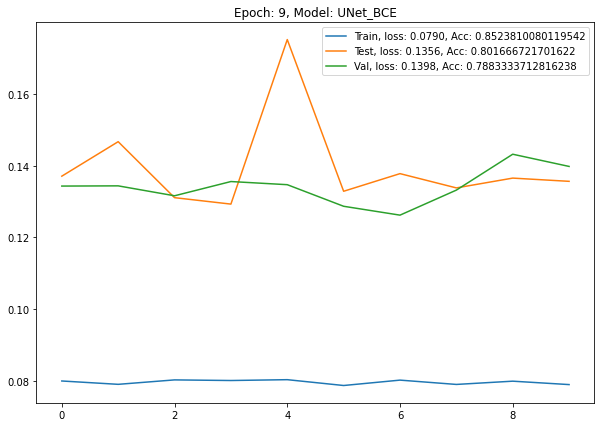

In [ ]:
u_best_score_bce, u_best_epoch_bce, u_mean_loss_bce, u_mean_score_bce, u_train_losses_bce, u_val_losses_bce, u_test_losses_bce, u_train_scores_bce, u_val_scores_bce, u_test_scores_bce = test_values(unet_model, bce_loss, 'UNet_BCE')

In [ ]:
u_best_score_bce

0.8016667366027832

In [ ]:
u_best_epoch_bce

1

In [ ]:
u_mean_loss_bce

tensor(0.1396, device='cuda:0')

In [ ]:
u_mean_score_bce

tensor(0.7920, device='cuda:0')

In [ ]:
score_UNet_BCE_val = score_model2(unet_model, iou_pytorch, data_val)

In [ ]:
score_UNet_BCE_val

0.7850000709295273

In [ ]:
score_UNet_BCE_test = score_model2(unet_model, iou_pytorch, data_ts)

In [ ]:
score_UNet_BCE_test

0.7950000762939453

In [ ]:
#del unet_model
#torch.cuda.empty_cache()

# UNet Dice

In [ ]:
unet_model_dice = UNet().to(device)

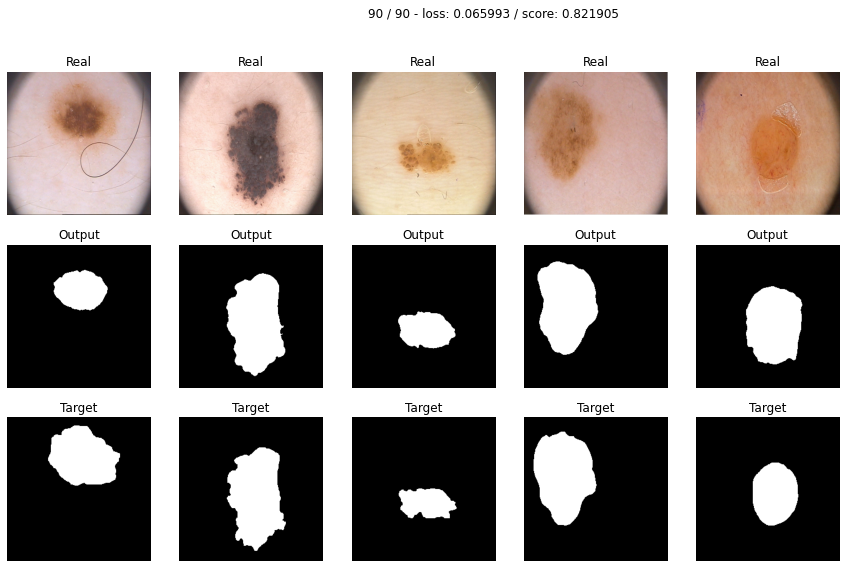

In [ ]:
history6 = train(unet_model_dice, optim.Adam(unet_model_dice.parameters()), dice_loss, 90, data_tr, data_val)

In [ ]:
u_loss_tr_dice, u_loss_val_dice, u_score_tr_dice, u_score_val_dice = zip(*history6)

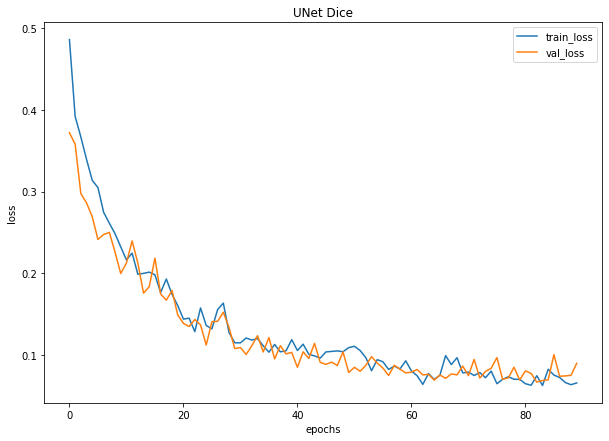

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_loss_tr_dice, label="train_loss")
plt.plot(u_loss_val_dice, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Dice')
plt.show()

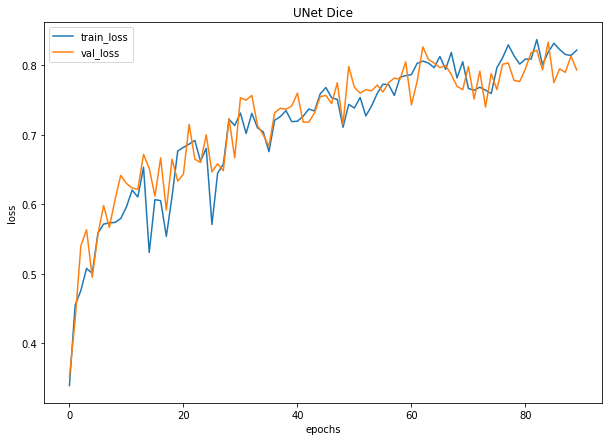

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_score_tr_dice, label="train_loss")
plt.plot(u_score_val_dice, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Dice')
plt.show()

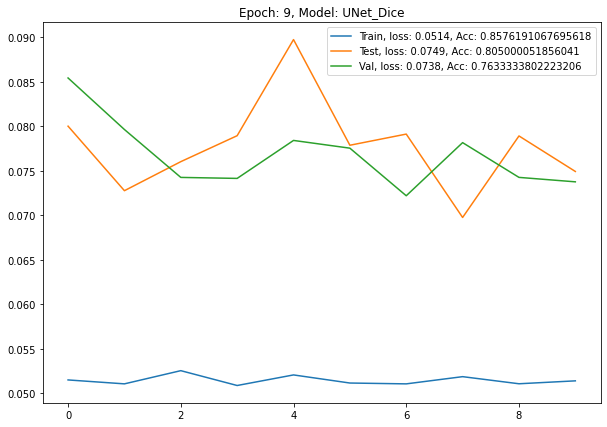

In [ ]:
u_best_score_dice, u_best_epoch_dice, u_mean_loss_dice, u_mean_score_dice, u_train_losses_dice, u_val_losses_dice, u_test_losses_dice, u_train_scores_dice, u_val_scores_dice, u_test_scores_dice = test_values(unet_model_dice, dice_loss, 'UNet_Dice')

In [ ]:
u_best_score_dice

0.8316667377948761

In [ ]:
u_best_epoch_dice

6

In [ ]:
u_mean_loss_dice

tensor(0.0778, device='cuda:0')

In [ ]:
u_mean_score_dice

tensor(0.8083, device='cuda:0')

In [ ]:
score_UNet_Dice_val = score_model2(unet_model_dice, iou_pytorch, data_val)

In [ ]:
score_UNet_Dice_val

0.7933334112167358

In [ ]:
score_UNet_Dice_test = score_model2(unet_model_dice, iou_pytorch, data_ts)

In [ ]:
score_UNet_Dice_test

0.7950000911951065

In [ ]:
#del unet_model_dice
#torch.cuda.empty_cache()

# UNet Focal

In [ ]:
unet_model_focal = UNet().to(device)

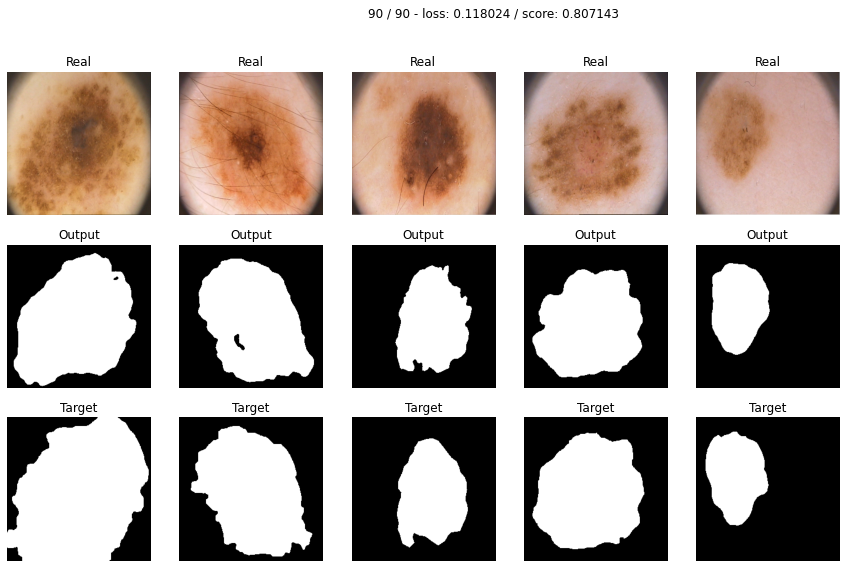

In [ ]:
history7 = train(unet_model_focal, optim.Adam(unet_model_focal.parameters()), focal_loss, 90, data_tr, data_val)

In [ ]:
u_loss_tr_focal, u_loss_val_focal, u_score_tr_focal, u_score_val_focal = zip(*history7)

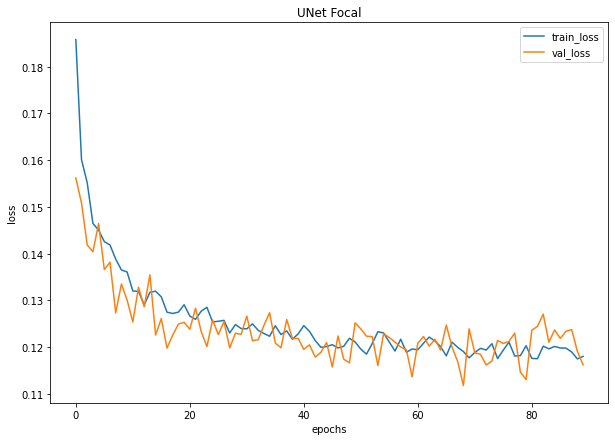

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_loss_tr_focal, label="train_loss")
plt.plot(u_loss_val_focal, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Focal')
plt.show()

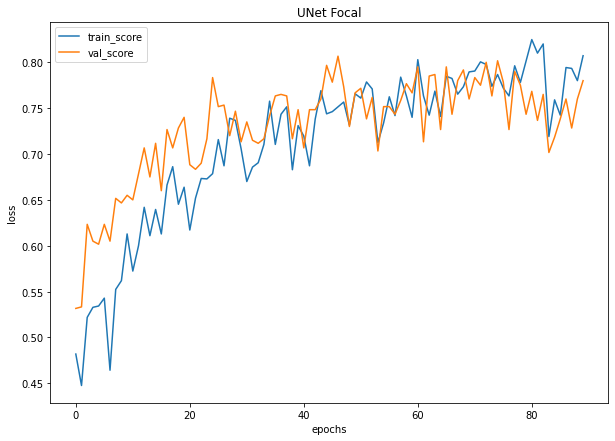

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_score_tr_focal, label="train_score")
plt.plot(u_score_val_focal, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Focal')
plt.show()

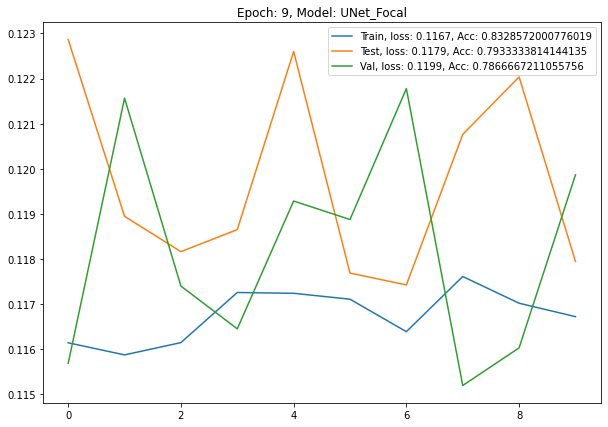

In [ ]:
u_best_score_focal, u_best_epoch_focal, u_mean_loss_focal, u_mean_score_focal, u_train_losses_focal, u_val_losses_focal, u_test_losses_focal, u_train_scores_focal, u_val_scores_focal, u_test_scores_focal = test_values(unet_model_focal, focal_loss, 'UNet_Focal')

In [ ]:
u_best_score_focal

0.7966667115688324

In [ ]:
u_best_epoch_focal

2

In [ ]:
u_mean_loss_focal

tensor(0.1197, device='cuda:0')

In [ ]:
u_mean_score_focal

tensor(0.7803, device='cuda:0')

In [ ]:
score_UNet_Focal_val = score_model2(unet_model_focal, iou_pytorch, data_val)

In [ ]:
score_UNet_Focal_val

0.7666667103767395

In [ ]:
score_UNet_Focal_test = score_model2(unet_model_focal, iou_pytorch, data_ts)

In [ ]:
score_UNet_Focal_test

0.7800000607967377

In [ ]:
#del unet_model_focal
#torch.cuda.empty_cache()

## UNet Focal_Tversky

In [ ]:
unet_model_focal_tversky = UNet().to(device)

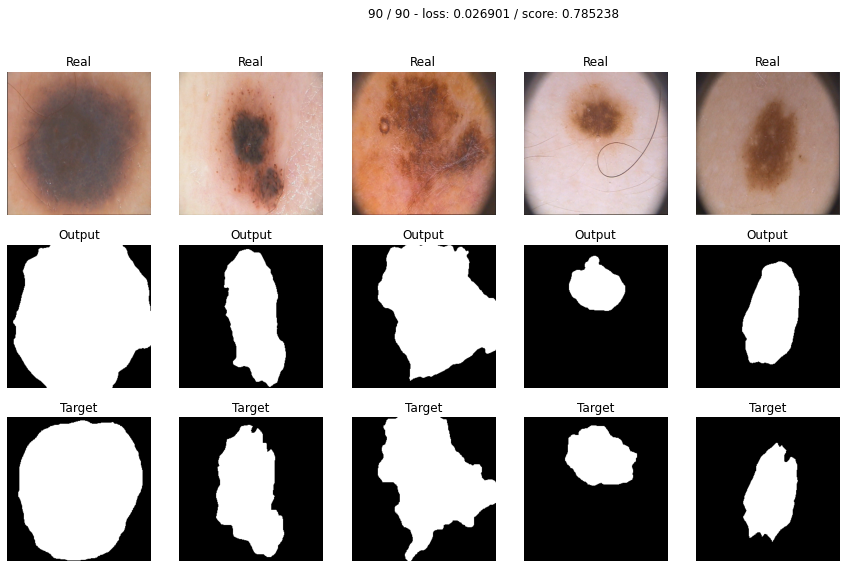

In [ ]:
history8 = train(unet_model_focal_tversky, optim.Adam(unet_model_focal_tversky.parameters()), focal_tversky_loss, 90, data_tr, data_val)

In [ ]:
u_loss_tr_focal_tversky, u_loss_val_focal_tversky, u_score_tr_focal_tversky, u_score_val_focal_tversky = zip(*history8)

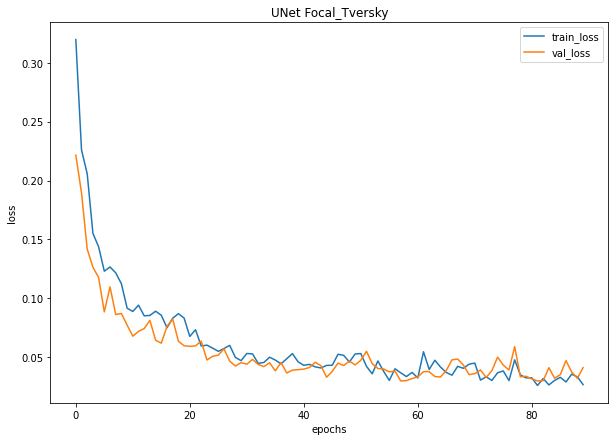

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_loss_tr_focal_tversky, label="train_loss")
plt.plot(u_loss_val_focal_tversky, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Focal_Tversky')
plt.show()

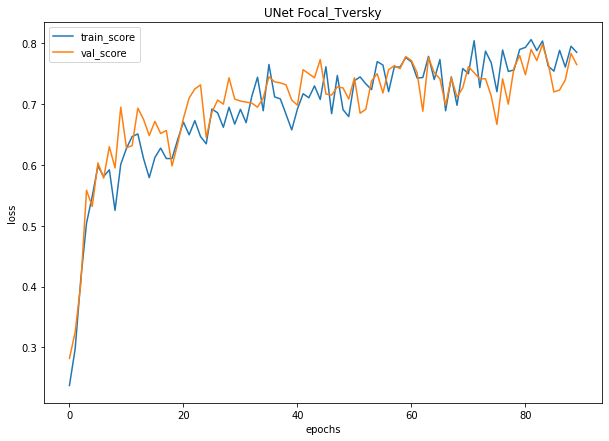

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_score_tr_focal_tversky, label="train_score")
plt.plot(u_score_val_focal_tversky, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Focal_Tversky')
plt.show()

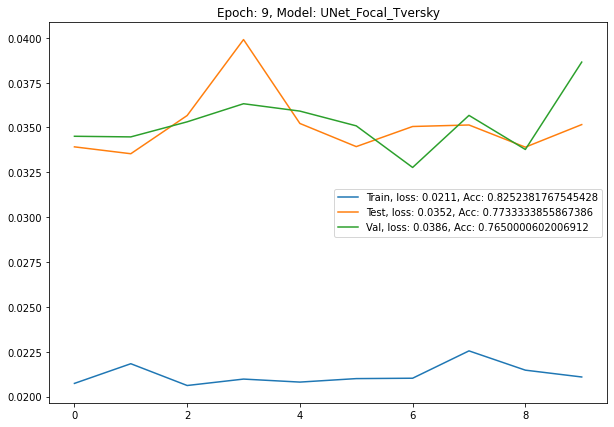

In [ ]:
u_best_score_focal_tversky, u_best_epoch_focal_tversky, u_mean_loss_focal_tversky, u_mean_score_focal_tversky, u_train_losses_focal_tversky, u_val_losses_focal_tversky, u_test_losses_focal_tversky, u_train_scores_focal_tversky, u_val_scores_focal_tversky, u_test_scores_focal_tversky = test_values(unet_model_focal_tversky, focal_tversky_loss, 'UNet_Focal_Tversky')

In [ ]:
u_best_score_focal_tversky

0.7733333855867386

In [ ]:
u_best_epoch_focal_tversky

9

In [ ]:
u_mean_loss_focal_tversky

tensor(0.0351, device='cuda:0')

In [ ]:
u_mean_score_focal_tversky

tensor(0.7563, device='cuda:0')

In [ ]:
score_UNet_Focal_Tversky_val = score_model2(unet_model_focal_tversky, iou_pytorch, data_val)

In [ ]:
score_UNet_Focal_Tversky_val

0.7650000303983688

In [ ]:
score_UNet_Focal_Tversky_test = score_model2(unet_model_focal_tversky, iou_pytorch, data_ts)

In [ ]:
score_UNet_Focal_Tversky_test

0.7500000447034836

In [ ]:
#del unet_model_focal_tversky
#torch.cuda.empty_cache()

# UNet_Lovasz

In [ ]:
unet_model_lovasz = UNet().to(device)

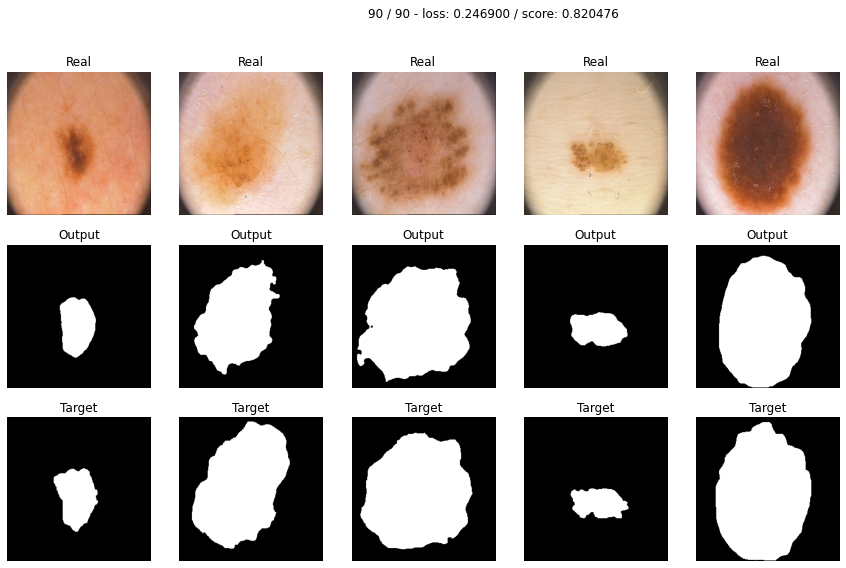

In [ ]:
history15 = train(unet_model_lovasz, optim.Adam(unet_model_lovasz.parameters()), lovasz_loss, 90, data_tr, data_val)

In [ ]:
u_loss_tr_lovasz, u_loss_val_lovasz, u_score_tr_lovasz, u_score_val_lovasz = zip(*history15)

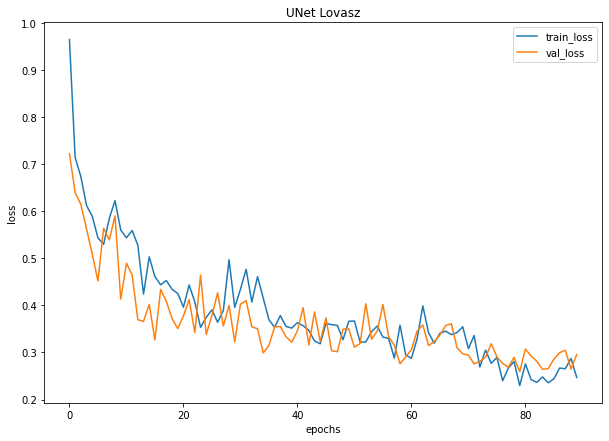

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_loss_tr_lovasz, label="train_loss")
plt.plot(u_loss_val_lovasz, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Lovasz')
plt.show()

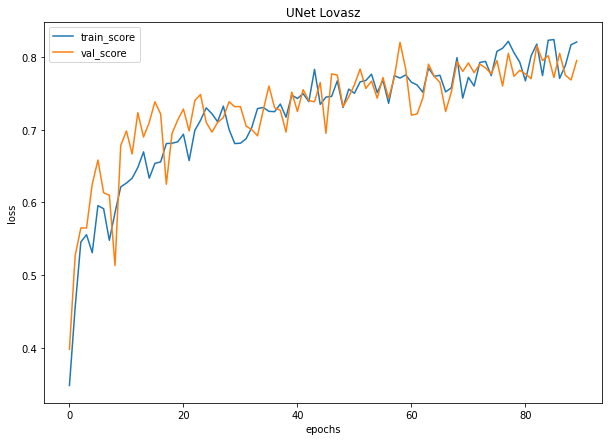

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u_score_tr_lovasz, label="train_score")
plt.plot(u_score_val_lovasz, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet Lovasz')
plt.show()

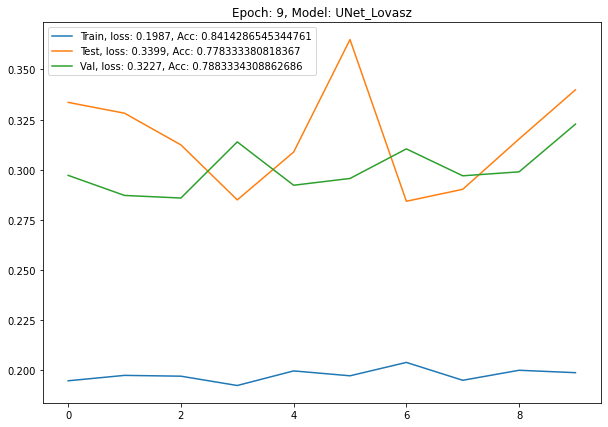

In [ ]:
u_best_score_lovasz, u_best_epoch_lovasz, u_mean_loss_lovasz, u_mean_score_lovasz, u_train_losses_lovasz, u_val_losses_lovasz, u_test_losses_lovasz, u_train_scores_lovasz, u_val_scores_lovasz, u_test_scores_lovasz = test_values(unet_model_lovasz, lovasz_loss, 'UNet_Lovasz')

In [ ]:
u_best_score_lovasz

0.7916667312383652

In [ ]:
u_best_epoch_lovasz

0

In [ ]:
u_mean_loss_lovasz

tensor(0.3163, device='cuda:0')

In [ ]:
u_mean_score_lovasz

tensor(0.7673, device='cuda:0')

In [ ]:
score_UNet_Lovasz_val = score_model2(unet_model_lovasz, iou_pytorch, data_val)

In [ ]:
score_UNet_Lovasz_val

0.7850000262260437

In [ ]:
score_UNet_Lovasz_test = score_model2(unet_model_lovasz, iou_pytorch, data_ts)

In [ ]:
score_UNet_Lovasz_test

0.7483334094285965

 Сравнение показателей loss и score для случаев использования различных функций потерь; UNet

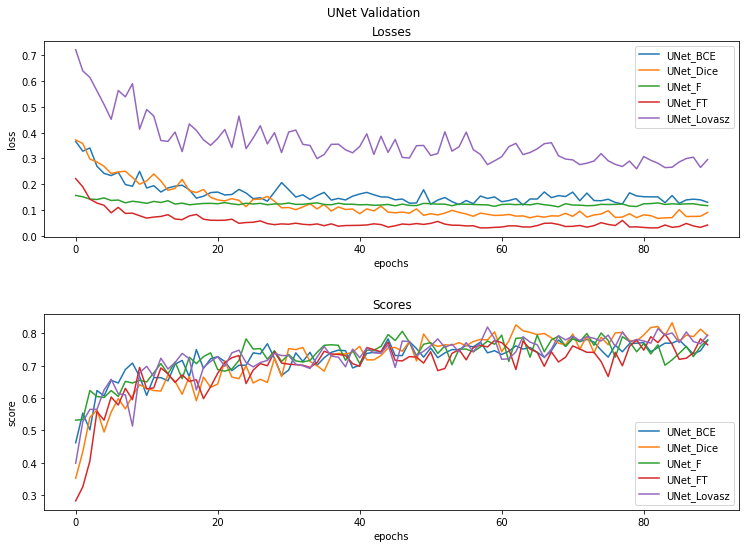

In [ ]:
 plt.rcParams['figure.figsize'] = (11, 8)
 fig, a = plt.subplots(2, 1)
 plt.sca(a[0])
 plt.plot(u_loss_val_bce, label="UNet_BCE")
 plt.plot(u_loss_val_dice, label="UNet_Dice")
 plt.plot(u_loss_val_focal, label='UNet_F')
 plt.plot(u_loss_val_focal_tversky, label='UNet_FT')
 plt.plot(u_loss_val_lovasz, label='UNet_Lovasz')
 plt.legend(loc='best')
 plt.xlabel("epochs")
 plt.ylabel("loss")
 plt.title('Losses')
 plt.sca(a[1])
 plt.plot(u_score_val_bce, label="UNet_BCE")
 plt.plot(u_score_val_dice, label="UNet_Dice")
 plt.plot(u_score_val_focal, label='UNet_F')
 plt.plot(u_score_val_focal_tversky, label='UNet_FT')
 plt.plot(u_score_val_lovasz, label='UNet_Lovasz')
 plt.legend(loc='best')
 plt.xlabel("epochs")
 plt.ylabel("score")
 plt.title('Scores')
 plt.suptitle('UNet Validation')
 fig.tight_layout(pad=3.0)

In [ ]:
unet_scores_val = {
    'model_name': ['UNet_BCE', 'UNet_Dice', 'UNet_F', 'UNet_FT', 'UNet_L'],
    'score': [score_UNet_BCE_val, score_UNet_Dice_val, score_UNet_Focal_val, score_UNet_Focal_Tversky_val, score_UNet_Lovasz_val]
  }

In [ ]:
unet_scores_ts = {
    'model_name': ['UNet_BCE', 'UNet_Dice', 'UNet_F', 'UNet_FT', 'UNet_L'],
    'score': [score_UNet_BCE_test, score_UNet_Dice_test, score_UNet_Focal_test, score_UNet_Focal_Tversky_test, score_UNet_Lovasz_test]
  }

In [ ]:
unet_scores_val_df = pd.DataFrame(data=unet_scores_val)
unet_scores_ts_df = pd.DataFrame(data=unet_scores_ts)

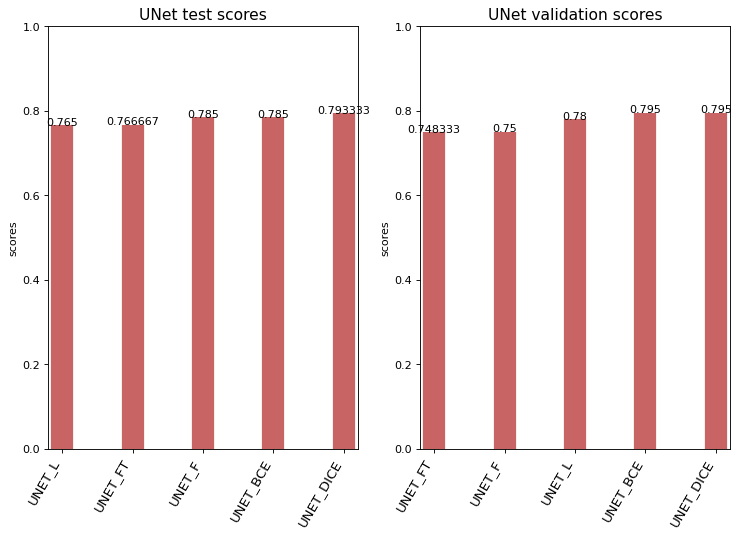

In [ ]:
unet_scores_val_df.sort_values('score', inplace=True)
unet_scores_ts_df.sort_values('score', inplace=True)
unet_scores_val_df.reset_index(inplace=True)
unet_scores_ts_df.reset_index(inplace=True)


fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(11,7), facecolor='white', dpi= 80, sharex=False)
ax0.vlines(x=unet_scores_val_df.index, ymin=0, ymax=unet_scores_val_df.score, color='firebrick', alpha=0.7, linewidth=20)
ax1.vlines(x=unet_scores_ts_df.index, ymin=0, ymax=unet_scores_ts_df.score, color='firebrick', alpha=0.7, linewidth=20)

for i, score in enumerate(unet_scores_val_df.score):
    ax0.text(i, score, round(score, 6), horizontalalignment='center')

for i, score in enumerate(unet_scores_ts_df.score):
    ax1.text(i, score, round(score, 6), horizontalalignment='center')


ax0.set_title('UNet test scores', fontdict={'size':14})
ax0.set(ylabel='scores', ylim=(0, 1))
ax0.set_xticklabels(unet_scores_ts_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)
ax0.set_xticks(unet_scores_ts_df.index)


ax1.set_title('UNet validation scores', fontdict={'size':14})
ax1.set(ylabel='scores', ylim=(0, 1))
ax1.set_xticks(unet_scores_val_df.index)
ax1.set_xticklabels(unet_scores_val_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)

plt.show()

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


# UNet2

В работе UNet и UNet2 "поменяны местами": в UNet используется nn.ConvTranspose2d, в UNet - nn.Upsample, реализовано созданием двух классов - Up и Up2

In [ ]:
class UNet2(nn.Module):
    def __init__(self, n_channels=3, n_classes=1):
        super(UNet2, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024)


        self.up1 = Up2(1024, 512)#, bilinear)
        self.up2 = Up2(512, 256)#, bilinear)
        self.up3 = Up2(256, 128)#, bilinear)
        self.up4 = Up2(128, 64)#, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)

        return logits

# UNet2 BCE

In [ ]:
unet2_model = UNet2().to(device)

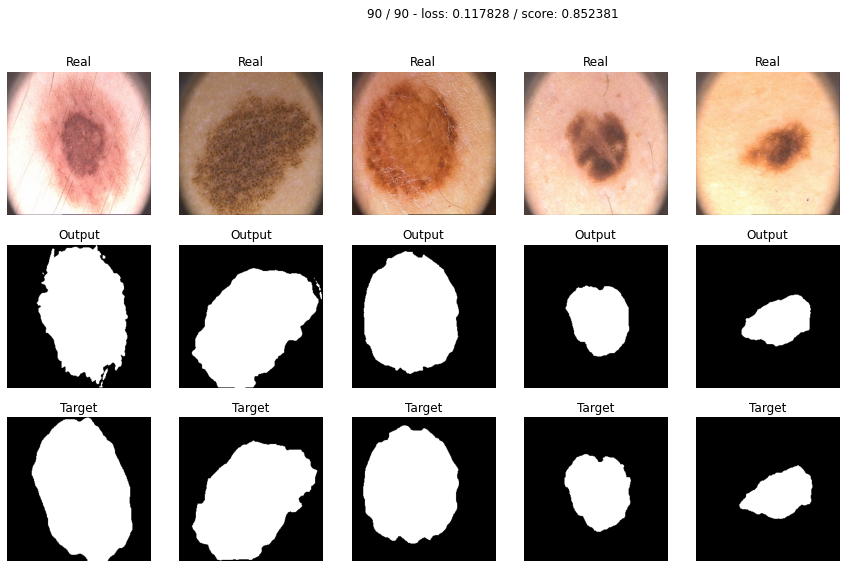

In [ ]:
history10 = train(unet2_model, optim.Adam(unet2_model.parameters()), bce_loss, 90, data_tr, data_val)

In [ ]:
u2_loss_tr_bce, u2_loss_val_bce, u2_score_tr_bce, u2_score_val_bce = zip(*history10)

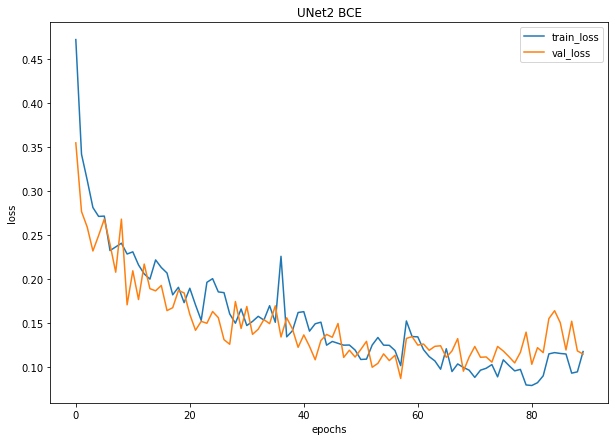

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_loss_tr_bce, label="train_loss")
plt.plot(u2_loss_val_bce, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 BCE')
plt.show()

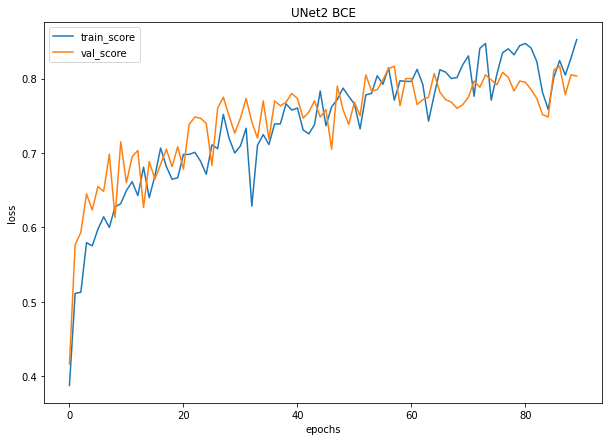

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_score_tr_bce, label="train_score")
plt.plot(u2_score_val_bce, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 BCE')
plt.show()

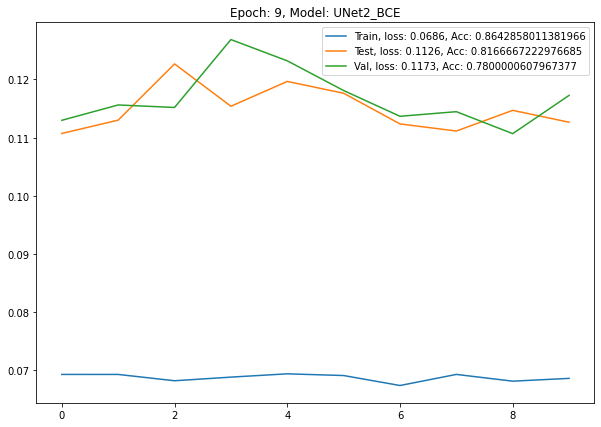

In [ ]:
u2_best_score_bce, u2_best_epoch_bce, u2_mean_loss_bce, u2_mean_score_bce, u2_train_losses_bce, u2_val_losses_bce, u2_test_losses_bce, u2_train_scores_bce, u2_val_scores_bce, u2_test_scores_bce = test_values(unet2_model, bce_loss, 'UNet2_BCE')

In [ ]:
u2_best_score_bce

0.8266667425632477

In [ ]:
u2_best_epoch_bce

6

In [ ]:
u2_mean_loss_bce

tensor(0.1150, device='cuda:0')

In [ ]:
u2_mean_score_bce

tensor(0.8117, device='cuda:0')

In [ ]:
score_UNet2_BCE_val = score_model2(unet2_model, iou_pytorch, data_val)

In [ ]:
score_UNet2_BCE_val

0.8100000768899918

In [ ]:
score_UNet2_BCE_test = score_model2(unet2_model, iou_pytorch, data_ts)

In [ ]:
score_UNet2_BCE_test

0.8266667425632477

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
torch.save(unet2_model.state_dict(), '/content/drive/MyDrive/UNet2_BCE')

In [ ]:
#del unet2_model

# UNet2 Dice

In [ ]:
unet2_model_dice = UNet2().to(device)

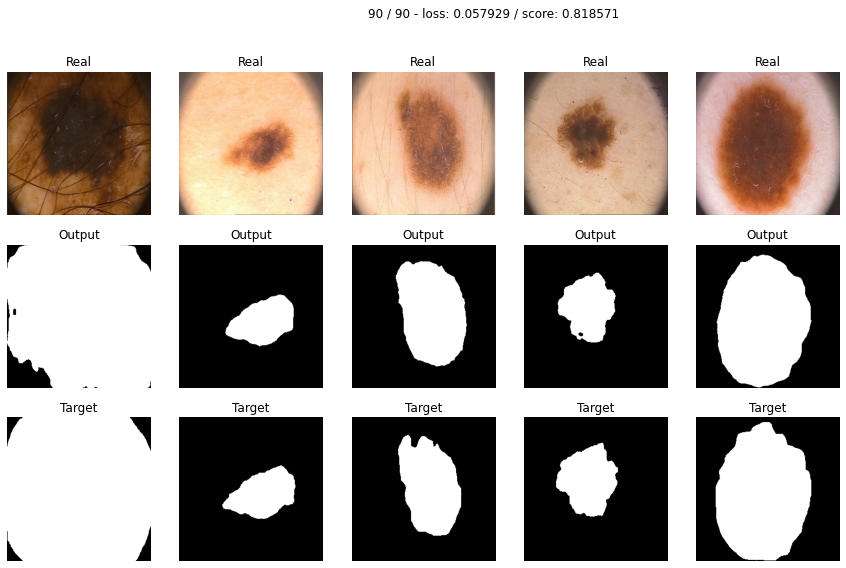

In [ ]:
history11 = train(unet2_model_dice, optim.Adam(unet2_model_dice.parameters()), dice_loss, 90, data_tr, data_val)

In [ ]:
u2_loss_tr_dice, u2_loss_val_dice, u2_score_tr_dice, u2_score_val_dice = zip(*history11)

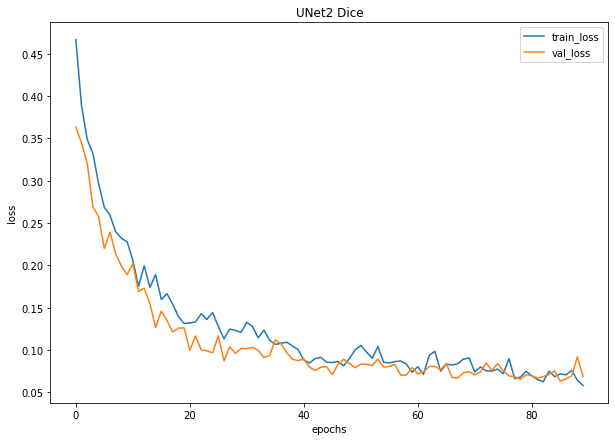

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_loss_tr_dice, label="train_loss")
plt.plot(u2_loss_val_dice, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Dice')
plt.show()

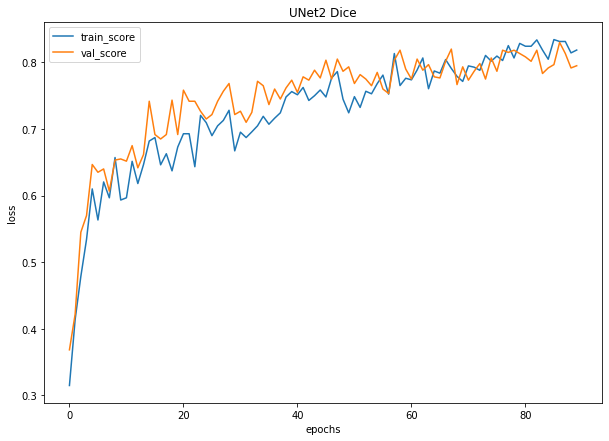

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_score_tr_dice, label="train_score")
plt.plot(u2_score_val_dice, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Dice')
plt.show()

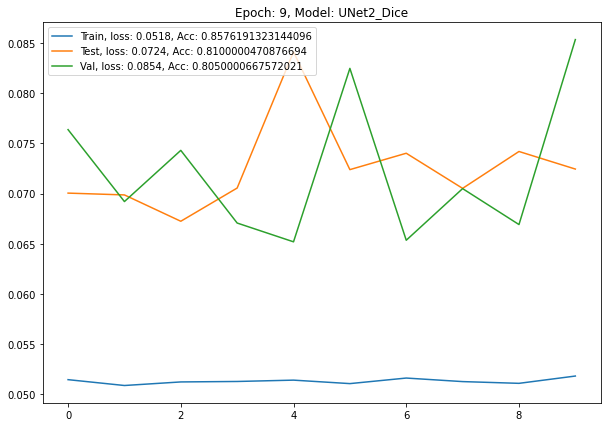

In [ ]:
u2_best_score_dice, u2_best_epoch_dice, u2_mean_loss_dice, u2_mean_score_dice, u2_train_losses_dice, u2_val_losses_dice, u2_test_losses_dice, u2_train_scores_dice, u2_val_scores_dice, u2_test_scores_dice = test_values(unet2_model_dice, dice_loss, 'UNet2_Dice')

In [ ]:
u2_best_score_dice

0.8166667371988297

In [ ]:
u2_best_epoch_dice

3

In [ ]:
u2_mean_loss_dice

tensor(0.0725, device='cuda:0')

In [ ]:
u2_mean_score_dice

tensor(0.8043, device='cuda:0')

In [ ]:
score_UNet2_Dice_val = score_model2(unet2_model_dice, iou_pytorch, data_val)

In [ ]:
score_UNet2_Dice_val

0.81166672706604

In [ ]:
score_UNet2_Dice_test = score_model2(unet2_model_dice, iou_pytorch, data_ts)

In [ ]:
score_UNet2_Dice_test

0.8133333772420883

In [ ]:
torch.save(unet2_model_dice.state_dict(), '/content/drive/MyDrive/UNet2_Dice.pth')

# UNet2 Focal

In [ ]:
unet2_model_focal = UNet2().to(device)

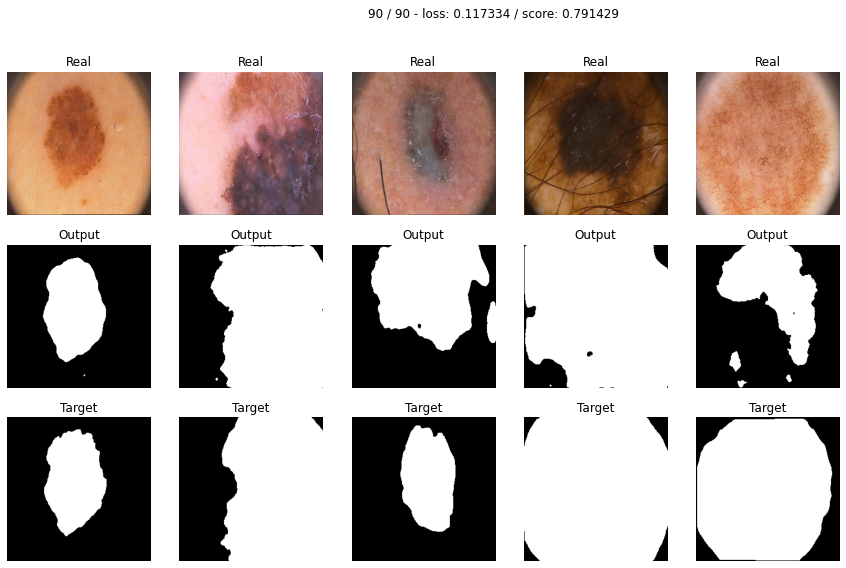

In [ ]:
history12 = train(unet2_model_focal, optim.Adam(unet2_model_focal.parameters()), focal_loss, 90, data_tr, data_val)

In [ ]:
u2_loss_tr_focal, u2_loss_val_focal, u2_score_tr_focal, u2_score_val_focal = zip(*history12)

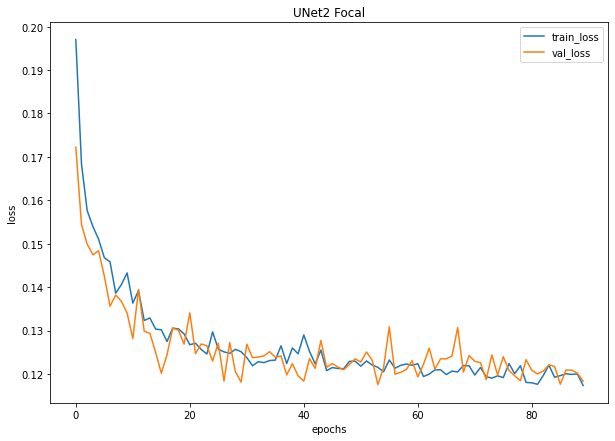

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_loss_tr_focal, label="train_loss")
plt.plot(u2_loss_val_focal, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Focal')
plt.show()

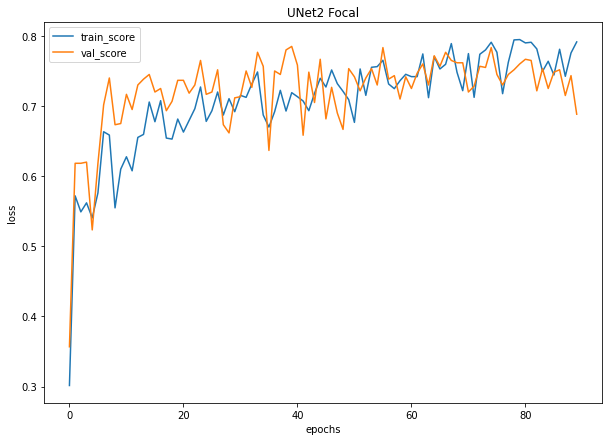

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_score_tr_focal, label="train_score")
plt.plot(u2_score_val_focal, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Focal')
plt.show()

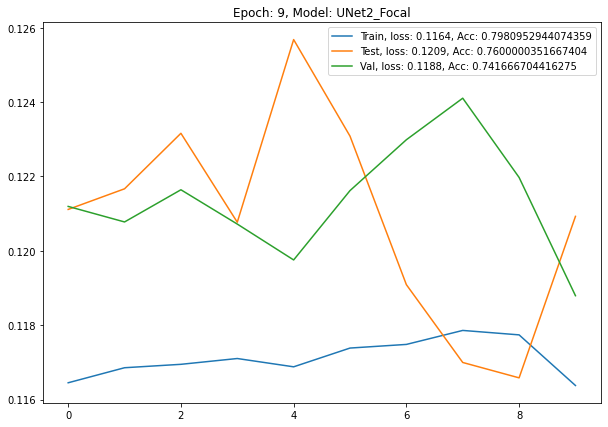

In [ ]:
u2_best_score_focal, u2_best_epoch_focal, u2_mean_loss_focal, u2_mean_score_focal, u2_train_losses_focal, u2_val_losses_focal, u2_test_losses_focal, u2_train_scores_focal, u2_val_scores_focal, u2_test_scores_focal = test_values(unet2_model_focal, focal_loss, 'UNet2_Focal')

In [ ]:
u2_best_score_focal

0.7966667413711548

In [ ]:
u2_best_epoch_focal

4

In [ ]:
u2_mean_loss_focal

tensor(0.1209, device='cuda:0')

In [ ]:
u2_mean_score_focal

tensor(0.7733, device='cuda:0')

In [ ]:
score_UNet2_Focal_val = score_model2(unet2_model_focal, iou_pytorch, data_val)

In [ ]:
score_UNet2_Focal_val

0.728333368897438

In [ ]:
score_UNet2_Focal_test = score_model2(unet2_model_focal, iou_pytorch, data_ts)

In [ ]:
score_UNet2_Focal_test

0.7766667157411575

In [ ]:
torch.save(unet2_model_focal.state_dict(), '/content/drive/MyDrive/UNet2_Focal')

In [ ]:
#del unet2_model_focal
#torch.cuda.empty_cache()

# UNet2 Focal_Tversky

In [ ]:
unet2_model_focal_tversky = UNet2().to(device)

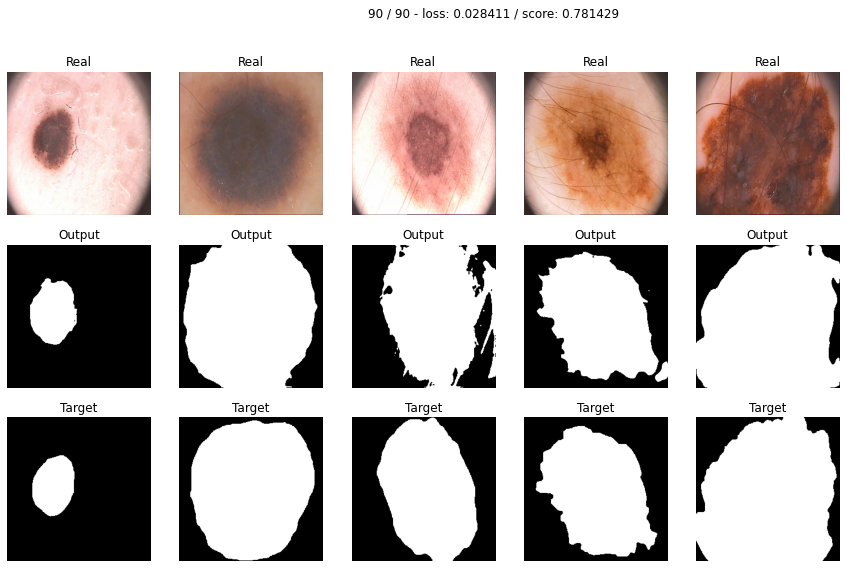

In [ ]:
history13 = train(unet2_model_focal_tversky, optim.Adam(unet2_model_focal_tversky.parameters()), focal_tversky_loss, 90, data_tr, data_val)

In [ ]:
u2_loss_tr_focal_tversky, u2_loss_val_focal_tversky, u2_score_tr_focal_tversky, u2_score_val_focal_tversky = zip(*history13)

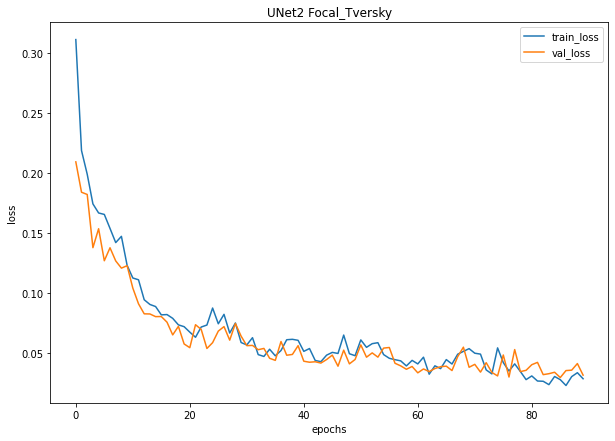

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_loss_tr_focal_tversky, label="train_loss")
plt.plot(u2_loss_val_focal_tversky, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Focal_Tversky')
plt.show()

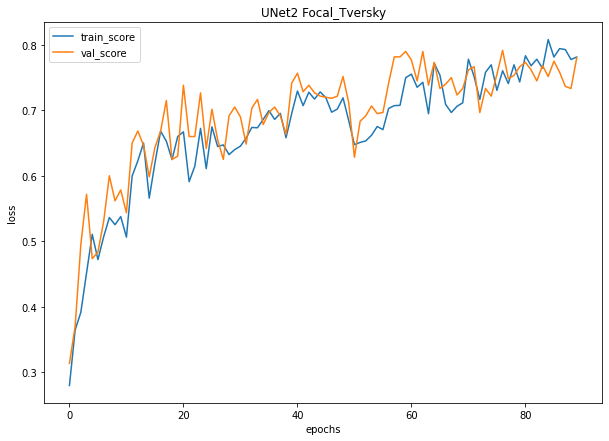

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_score_tr_focal_tversky, label="train_score")
plt.plot(u2_score_val_focal_tversky, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Focal_Tversky')
plt.show()

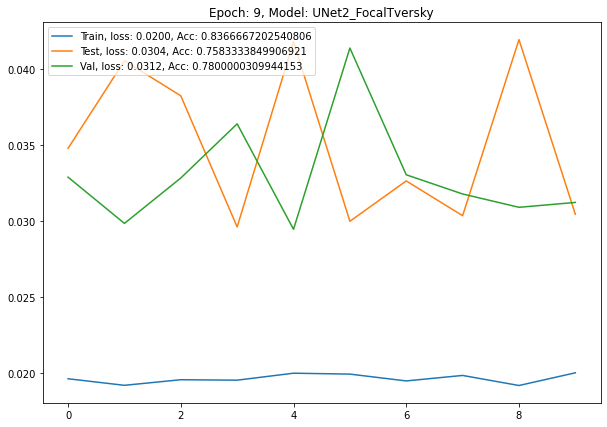

In [ ]:
u2_best_score_focal_tversky, u2_best_epoch_focal_tversky, u2_mean_loss_focal_tversky, u2_mean_score_focal_tversky, u2_train_losses_focal_tversky, u2_val_losses_focal_tversky, u2_test_losses_focal_tversky, u2_train_scores_focal_tversky, u2_val_scores_focal_tversky, u2_test_scores_focal_tversky = test_values(unet2_model_focal_tversky, focal_tversky_loss, 'UNet2_FocalTversky')

In [ ]:
u2_best_score_focal_tversky

0.7983333915472031

In [ ]:
u2_best_epoch_focal_tversky

4

In [ ]:
u2_mean_loss_focal_tversky

tensor(0.0350, device='cuda:0')

In [ ]:
u2_mean_score_focal_tversky

tensor(0.7827, device='cuda:0')

In [ ]:
score_UNet2_Focal_Tversky_val = score_model2(unet2_model_focal_tversky, iou_pytorch, data_val)

In [ ]:
score_UNet2_Focal_Tversky_val

0.7800000607967377

In [ ]:
score_UNet2_Focal_Tversky_test = score_model2(unet2_model_focal_tversky, iou_pytorch, data_ts)

In [ ]:
score_UNet2_Focal_Tversky_test

0.7950000613927841

In [ ]:
torch.save(unet2_model_focal_tversky.state_dict(), '/content/drive/MyDrive/UNet2_FT.pth')

In [ ]:
#del unet2_model_focal_tversky
#torch.cuda.empty_cache()

# UNet2_Lovasz

In [ ]:
unet2_model_lovasz = UNet2().to(device)

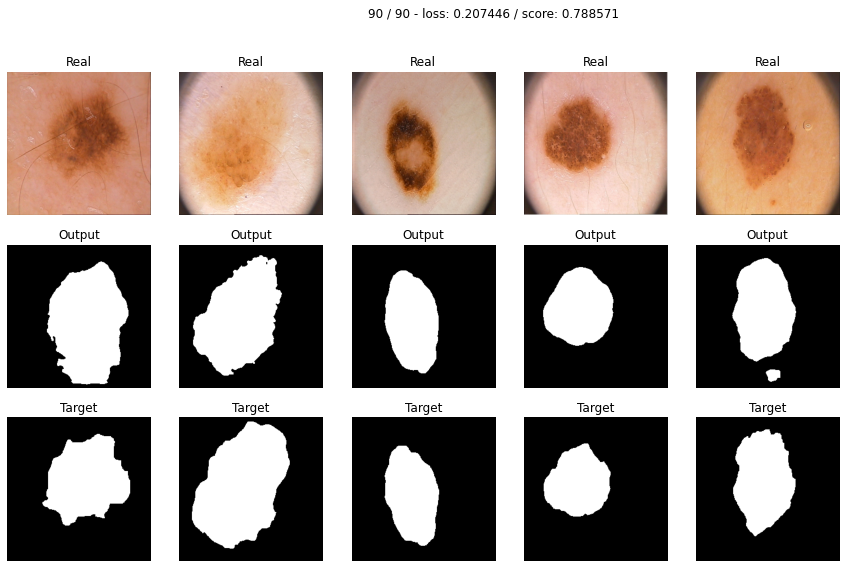

In [ ]:
history14 = train(unet2_model_lovasz, optim.Adam(unet2_model_lovasz.parameters()), lovasz_loss, 90, data_tr, data_val)

In [ ]:
u2_loss_tr_lovasz, u2_loss_val_lovasz, u2_score_tr_lovasz, u2_score_val_lovasz = zip(*history14)

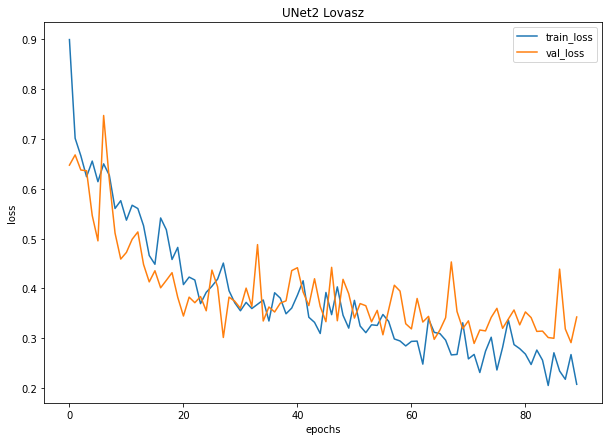

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_loss_tr_lovasz, label="train_loss")
plt.plot(u2_loss_val_lovasz, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Lovasz')
plt.show()

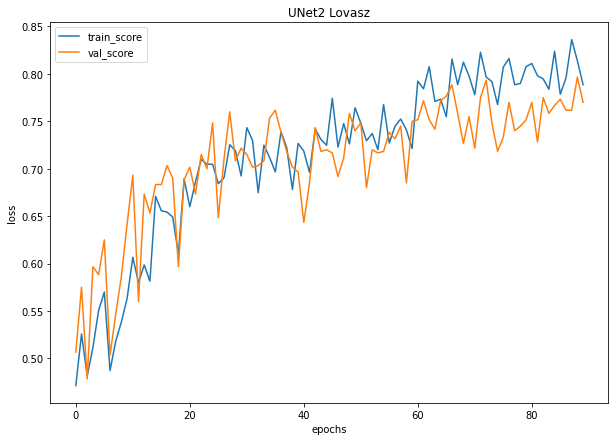

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(u2_score_tr_lovasz, label="train_score")
plt.plot(u2_score_val_lovasz, label="val_score")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('UNet2 Lovasz')
plt.show()

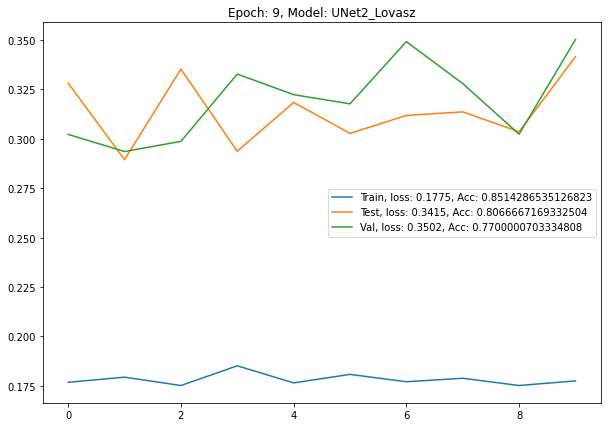

In [ ]:
u2_best_score_lovasz, u2_best_epoch_lovasz, u2_mean_loss_lovasz, u2_mean_score_lovasz, u2_train_losses_lovasz, u2_val_losses_lovasz, u2_test_losses_lovasz, u2_train_scores_lovasz, u2_val_scores_lovasz, u2_test_scores_lovasz = test_values(unet2_model_lovasz, lovasz_loss, 'UNet2_Lovasz')

In [ ]:
u2_best_score_lovasz

0.8266667425632477

In [ ]:
u2_best_epoch_lovasz

8

In [ ]:
u2_mean_loss_lovasz

tensor(0.3138, device='cuda:0')

In [ ]:
u2_mean_score_lovasz

tensor(0.8067, device='cuda:0')

In [ ]:
score_UNet2_Lovasz_val = score_model2(unet2_model_lovasz, iou_pytorch, data_val)

In [ ]:
score_UNet2_Lovasz_val

0.7500000447034836

In [ ]:
score_UNet2_Lovasz_test = score_model2(unet2_model_lovasz, iou_pytorch, data_ts)

In [ ]:
score_UNet2_Lovasz_test

0.8133334219455719

In [ ]:
torch.save(unet2_model_lovasz.state_dict(), '/content/drive/MyDrive/UNet2_Lovasz.pth')

In [ ]:
#del unet2_model_lovasz

Сравнение показателей для всех функций потерь; UNet2

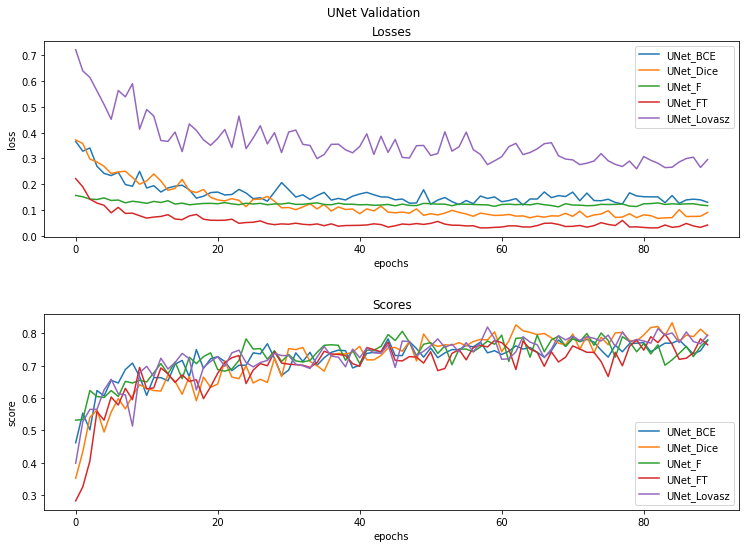

In [ ]:
plt.rcParams['figure.figsize'] = (11, 8)

 #plt.figure(figsize=(10, 7))
fig, a = plt.subplots(2, 1)
plt.sca(a[0])
plt.plot(u_loss_val_bce, label="UNet_BCE")
plt.plot(u_loss_val_dice, label="UNet_Dice")
plt.plot(u_loss_val_focal, label='UNet_F')
plt.plot(u_loss_val_focal_tversky, label='UNet_FT')
plt.plot(u_loss_val_lovasz, label='UNet_Lovasz')
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title('Losses')
plt.sca(a[1])
plt.plot(u_score_val_bce, label="UNet_BCE")
plt.plot(u_score_val_dice, label="UNet_Dice")
plt.plot(u_score_val_focal, label='UNet_F')
plt.plot(u_score_val_focal_tversky, label='UNet_FT')
plt.plot(u_score_val_lovasz, label='UNet_Lovasz')
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("score")
plt.title('Scores')
plt.suptitle('UNet Validation')
fig.tight_layout(pad=3.0)

In [ ]:
unet2_scores_val = {
    'model_name': ['UNet2_BCE', 'UNet2_Dice', 'UNet2_F', 'UNet2_FT', 'UNet2_L'],
    'score': [score_UNet2_BCE_val, score_UNet2_Dice_val, score_UNet2_Focal_val, score_UNet2_Focal_Tversky_val, score_UNet2_Lovasz_val]
  }

In [ ]:
unet2_scores_ts = {
    'model_name': ['UNet2_BCE', 'UNet2_Dice', 'UNet2_F', 'UNet2_FT', 'UNet2_L'],
    'score': [score_UNet2_BCE_test, score_UNet2_Dice_test, score_UNet2_Focal_test, score_UNet2_Focal_Tversky_test, score_UNet2_Lovasz_test]
  }

In [ ]:
unet2_scores_val_df = pd.DataFrame(data=unet2_scores_val)
unet2_scores_ts_df = pd.DataFrame(data=unet2_scores_ts)

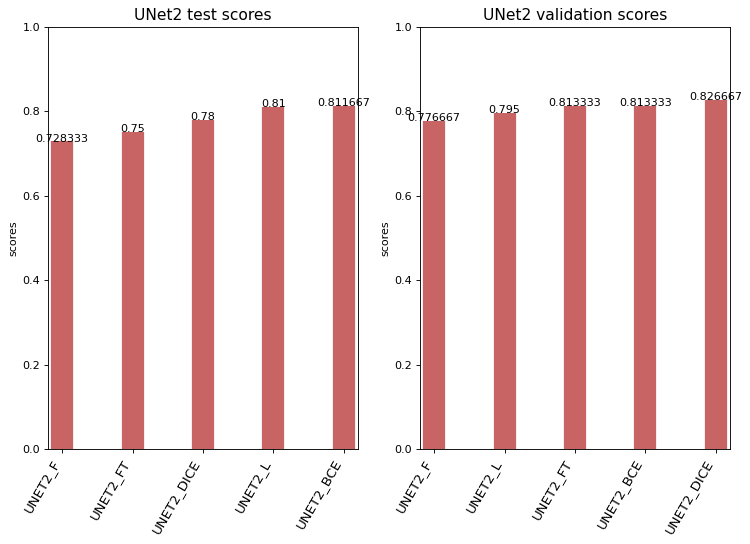

In [ ]:
unet2_scores_val_df.sort_values('score', inplace=True)
unet2_scores_ts_df.sort_values('score', inplace=True)
unet2_scores_val_df.reset_index(inplace=True)
unet2_scores_ts_df.reset_index(inplace=True)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(11,7), facecolor='white', dpi= 80, sharex=False)
ax0.vlines(x=unet2_scores_val_df.index, ymin=0, ymax=unet2_scores_val_df.score, color='firebrick', alpha=0.7, linewidth=20)
ax1.vlines(x=unet2_scores_ts_df.index, ymin=0, ymax=unet2_scores_ts_df.score, color='firebrick', alpha=0.7, linewidth=20)

for i, score in enumerate(unet2_scores_val_df.score):
    ax0.text(i, score, round(score, 6), horizontalalignment='center')

for i, score in enumerate(unet2_scores_ts_df.score):
    ax1.text(i, score, round(score, 6), horizontalalignment='center')


ax0.set_title('UNet2 test scores', fontdict={'size':14})
ax0.set(ylabel='scores', ylim=(0, 1))
ax0.set_xticklabels(unet2_scores_ts_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)
ax0.set_xticks(unet2_scores_ts_df.index)


ax1.set_title('UNet2 validation scores', fontdict={'size':14})
ax1.set(ylabel='scores', ylim=(0, 1))
ax1.set_xticks(unet2_scores_val_df.index)
ax1.set_xticklabels(unet2_scores_val_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)

plt.show()

In [ ]:
final_scores_val = {
    'model_name': ['SegNet_BCE', 'SegNet_Dice', 'SegNet_F', 'SegNet_FT', 'SegNet_L', 
                   'SegNet2_BCE', 'SegNet2_Dice', 'SegNet2_F', 'SegNet2_FT', 'SegNet2_L',
                   'UNet_BCE', 'UNet_Dice', 'UNet_F', 'UNet_FT', 'UNet_L',
                   'UNet2_BCE', 'UNet2_Dice', 'UNet2_F', 'UNet2_FT', 'UNet2_L'],
    'score': [score_SegNet_BCE_val, score_SegNet_Dice_val, score_SegNet_Focal_val, score_SegNet_FocalTversky_val, score_SegNet_Lovasz_val,
              score_SegNet2_BCE_val, score_SegNet2_Dice_val, score_SegNet2_Focal_val, score_SegNet2_FocalTversky_val, score_SegNet2_Lovasz_val,
              score_UNet_BCE_val, score_UNet_Dice_val, score_UNet_Focal_val, score_UNet_FocalTversky_val, score_UNet_Lovasz_val,
              score_UNet2_BCE_val, score_UNet2_Dice_val, score_UNet2_Focal_val, score_UNet2_FocalTversky_val, score_UNet2_Lovasz_val]
}


final_scores_ts = {
    'model_name': ['SegNet_BCE', 'SegNet_Dice', 'SegNet_F', 'SegNet_FT', 'SegNet_L', 
                   'SegNet2_BCE', 'SegNet2_Dice', 'SegNet2_F', 'SegNet2_FT', 'SegNet2_L',
                   'UNet_BCE', 'UNet_Dice', 'UNet_F', 'UNet_FT', 'UNet_L',
                   'UNet2_BCE', 'UNet2_Dice', 'UNet2_F', 'UNet2_FT', 'UNet2_L'],
    'score': [score_SegNet_BCE_ts, score_SegNet_Dice_ts, score_SegNet_Focal_ts, score_SegNet_FocalTversky_ts, score_SegNet_Lovasz_ts,
              score_SegNet2_BCE_ts, score_SegNet2_Dice_ts, score_SegNet2_Focal_ts, score_SegNet2_FocalTversky_ts, score_SegNet2_Lovasz_ts,
              score_UNet_BCE_ts, score_UNet_Dice_ts, score_UNet_Focal_ts, score_UNet_FocalTversky_ts, score_UNet_Lovasz_ts,
              score_UNet2_BCE_ts, score_UNet2_Dice_ts, score_UNet2_Focal_ts, score_UNet2_FocalTversky_ts, score_UNet2_Lovasz_ts]
}

In [ ]:
final_scores_val_df = pd.DataFrame(data=final_scores_val)
final_scores_ts_df = pd.DataFrame(data=final_scores_ts)

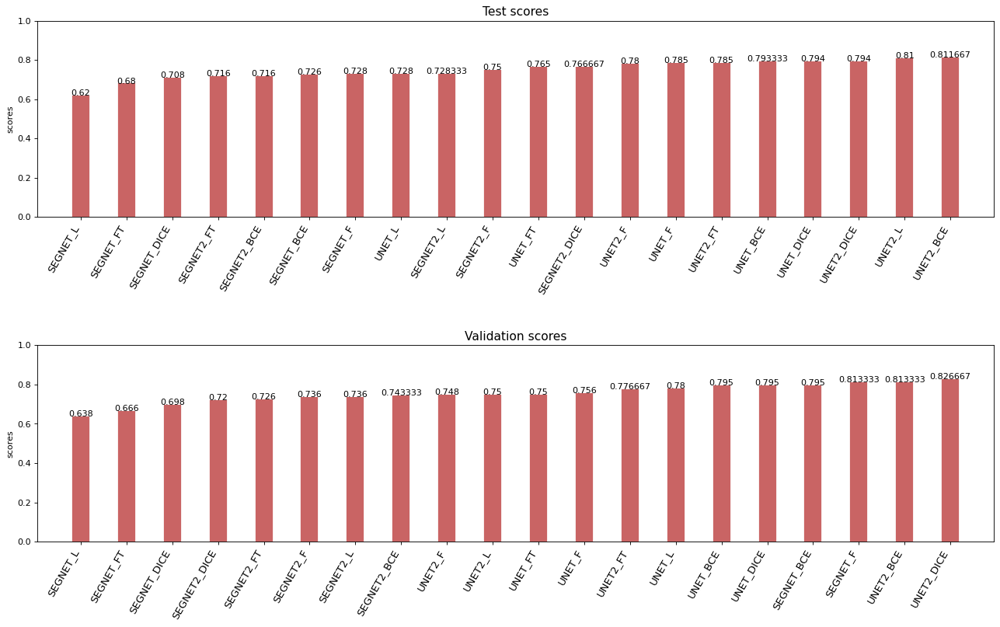

In [ ]:
final_scores_val_df.sort_values('score', inplace=True)
final_scores_ts_df.sort_values('score', inplace=True)

fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(17,11), facecolor='white', dpi= 80, sharex=False)
ax0.vlines(x=final_scores_val_df.index, ymin=0, ymax=final_scores_val_df.score, color='firebrick', alpha=0.7, linewidth=20)
ax1.vlines(x=final_scores_ts_df.index, ymin=0, ymax=final_scores_ts_df.score, color='firebrick', alpha=0.7, linewidth=20)
t
for i, score in enumerate(final_scores_val_df.score):
    ax0.text(i, score, round(score, 6), horizontalalignment='center')

for i, score in enumerate(final_scores_ts_df.score):
    ax1.text(i, score, round(score, 6), horizontalalignment='center')


ax0.set_title('Test scores', fontdict={'size':14})
ax0.set(ylabel='scores', ylim=(0, 1))
ax0.set_xticklabels(final_scores_ts_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)
ax0.set_xticks(final_scores_ts_df.index)


ax1.set_title('Validation scores', fontdict={'size':14})
ax1.set(ylabel='scores', ylim=(0, 1))
ax1.set_xticks(final_scores_val_df.index)
ax1.set_xticklabels(final_scores_val_df.model_name.str.upper(), rotation=60, horizontalalignment='right', fontsize=12)
fig.tight_layout(pad=4.0)

plt.show()

In [ ]:
#Графики размещены непосредственно в "теле" отчете